# **Feature Engineering**

## Objectives

1. Engineer features for regression model

## Inputs

1. House_price_records_clean.csv

## Outputs

1. generate a list with variables to engineer


## Conclusions

We will apply the below encoders to our variables.

Ordinal Encoder: 'BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual'

Power Transformer: 'BedroomAbvGr', 'BsmtFinSF1', 'BsmtUnfSF', 'GrLivArea', 'LotArea', 'LotFrontage', 'MasVnrArea', 'OpenPorchSF', 'OverallCond', 
'OverallQual', 'TotalBsmtSF', 'YearRemodAdd'

Windsorizer: All Variables.

Standard Scalar: All variables.

Drop:  '1stFlrSF', '2ndFlrSF', 'GarageArea', 'GarageYrBlt', 'YearBuilt'

## Notes
We have already imputed missing data in the data cleaning section. In order to perform the price correlation study and train the model we will need to apply some additional transformations to the data. The purpose of this notebook is to see the effect of the various transformers so we can see which is the most suitable. We will apply the actual changes in the other notebooks.

---

# Change working directory

* We are assuming you will store the notebooks in a subfolder, therefore when running the notebook in the editor, you will need to change the working directory

We need to change the working directory from its current folder to its parent folder
* We access the current directory with os.getcwd()

In [1]:
import os
current_dir = os.getcwd()
current_dir

'/workspace/Heritage-Housing/jupyter_notebooks'

We want to make the parent of the current directory the new current directory
* os.path.dirname() gets the parent directory
* os.chir() defines the new current directory

In [2]:
os.chdir(os.path.dirname(current_dir))
print("You set a new current directory")

You set a new current directory


Confirm the new current directory

In [3]:
current_dir = os.getcwd()
current_dir

'/workspace/Heritage-Housing'

## Load and inspect clean data.

We load and inspect the data to confirm we are working with the correct data set. We note that there are no missing values

In [4]:
# Load  and inspect cleaned Data
import numpy as np
import pandas as pd
house_prices_clean_df = pd.read_csv(f"outputs/datasets/clean_data/House_prices_records_clean.csv")
house_prices_clean_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   1stFlrSF      1460 non-null   int64  
 1   2ndFlrSF      1460 non-null   float64
 2   BedroomAbvGr  1460 non-null   float64
 3   BsmtExposure  1460 non-null   object 
 4   BsmtFinSF1    1460 non-null   int64  
 5   BsmtFinType1  1460 non-null   object 
 6   BsmtUnfSF     1460 non-null   int64  
 7   GarageArea    1460 non-null   int64  
 8   GarageFinish  1460 non-null   object 
 9   GarageYrBlt   1460 non-null   float64
 10  GrLivArea     1460 non-null   int64  
 11  KitchenQual   1460 non-null   object 
 12  LotArea       1460 non-null   int64  
 13  LotFrontage   1460 non-null   float64
 14  MasVnrArea    1460 non-null   float64
 15  OpenPorchSF   1460 non-null   int64  
 16  OverallCond   1460 non-null   int64  
 17  OverallQual   1460 non-null   int64  
 18  TotalBsmtSF   1460 non-null 

In the data inspection notebook we already observed that other than SalePrice we can catagorise variables in three ways.

1. Measurements. Measurements related to the size of the house features. These are negatively skewed
2. Quality Ratings. Rating related to the quality of house features. They are normally distributed these are 
3. Age related. Related to when work was performed on the house. They are positively skewed.

Measurements and Age related variables are numerical and quality ratings are catagorical. 

We also note from the DataInspection notebook the presence of some outliers in some catagories, and that many catagories have a large number of zero's - which we take to mean the feature is absent.

Given the above we will examine the best methods preparing data for the model.

---

# Testing

The below code was taken from The Code institute "Churnometer" Walkthrough project. The Github repo is here https://github.com/Code-Institute-Solutions/churnometer.

These functions show the effects of different transformers on our data so we can decide which are most suitable.

In [5]:
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings
from feature_engine import transformation as vt
from feature_engine.outliers import Winsorizer
from feature_engine.encoding import OrdinalEncoder
sns.set(style="whitegrid")
warnings.filterwarnings('ignore')


def FeatureEngineeringAnalysis(df, analysis_type=None):
    """
    - used for quick feature engineering on numerical and categorical variables
    to decide which transformation can better transform the distribution shape
    - Once transformed, use a reporting tool, like ydata-profiling, to evaluate distributions
    """
    check_missing_values(df)
    allowed_types = ['numerical', 'ordinal_encoder', 'outlier_winsorizer']
    check_user_entry_on_analysis_type(analysis_type, allowed_types)
    list_column_transformers = define_list_column_transformers(analysis_type)

    # Loop in each variable and engineer the data according to the analysis type
    df_feat_eng = pd.DataFrame([])
    for column in df.columns:
        # create additional columns (column_method) to apply the methods
        df_feat_eng = pd.concat([df_feat_eng, df[column]], axis=1)
        for method in list_column_transformers:
            df_feat_eng[f"{column}_{method}"] = df[column]

        # Apply transformers in respective column_transformers
        df_feat_eng, list_applied_transformers = apply_transformers(
            analysis_type, df_feat_eng, column)

        # For each variable, assess how the transformations perform
        transformer_evaluation(
            column, list_applied_transformers, analysis_type, df_feat_eng)

    return df_feat_eng


def check_user_entry_on_analysis_type(analysis_type, allowed_types):
    """ Check analysis type """
    if analysis_type is None:
        raise SystemExit(
            f"You should pass analysis_type parameter as one of the following options: {allowed_types}")
    if analysis_type not in allowed_types:
        raise SystemExit(
            f"analysis_type argument should be one of these options: {allowed_types}")


def check_missing_values(df):
    if df.isna().sum().sum() != 0:
        raise SystemExit(
            f"There is a missing value in your dataset. Please handle that before getting into feature engineering.")


def define_list_column_transformers(analysis_type):
    """ Set suffix columns according to analysis_type"""
    if analysis_type == 'numerical':
        list_column_transformers = [
            "log_e", "log_10", "reciprocal", "power", "box_cox", "yeo_johnson"]

    elif analysis_type == 'ordinal_encoder':
        list_column_transformers = ["ordinal_encoder"]

    elif analysis_type == 'outlier_winsorizer':
        list_column_transformers = ['iqr']

    return list_column_transformers


def apply_transformers(analysis_type, df_feat_eng, column):
    for col in df_feat_eng.select_dtypes(include='category').columns:
        df_feat_eng[col] = df_feat_eng[col].astype('object')

    if analysis_type == 'numerical':
        df_feat_eng, list_applied_transformers = FeatEngineering_Numerical(
            df_feat_eng, column)

    elif analysis_type == 'outlier_winsorizer':
        df_feat_eng, list_applied_transformers = FeatEngineering_OutlierWinsorizer(
            df_feat_eng, column)

    elif analysis_type == 'ordinal_encoder':
        df_feat_eng, list_applied_transformers = FeatEngineering_CategoricalEncoder(
            df_feat_eng, column)

    return df_feat_eng, list_applied_transformers


def transformer_evaluation(column, list_applied_transformers, analysis_type, df_feat_eng):
    # For each variable, assess how the transformations perform
    print(f"* Variable Analyzed: {column}")
    print(f"* Applied transformation: {list_applied_transformers} \n")
    for col in [column] + list_applied_transformers:

        if analysis_type != 'ordinal_encoder':
            DiagnosticPlots_Numerical(df_feat_eng, col)

        else:
            if col == column:
                DiagnosticPlots_Categories(df_feat_eng, col)
            else:
                DiagnosticPlots_Numerical(df_feat_eng, col)

        print("\n")


def DiagnosticPlots_Categories(df_feat_eng, col):
    plt.figure(figsize=(4, 3))
    sns.countplot(data=df_feat_eng, x=col, palette=[
                  '#432371'], order=df_feat_eng[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.suptitle(f"{col}", fontsize=30, y=1.05)
    plt.show()
    print("\n")


def DiagnosticPlots_Numerical(df, variable):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    sns.histplot(data=df, x=variable, kde=True, element="step", ax=axes[0])
    stats.probplot(df[variable], dist="norm", plot=axes[1])
    sns.boxplot(x=df[variable], ax=axes[2])

    axes[0].set_title('Histogram')
    axes[1].set_title('QQ Plot')
    axes[2].set_title('Boxplot')
    fig.suptitle(f"{variable}", fontsize=30, y=1.05)
    plt.tight_layout()
    plt.show()


def FeatEngineering_CategoricalEncoder(df_feat_eng, column):
    list_methods_worked = []
    try:
        encoder = OrdinalEncoder(encoding_method='arbitrary', variables=[
                                 f"{column}_ordinal_encoder"])
        df_feat_eng = encoder.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_ordinal_encoder")

    except Exception:
        df_feat_eng.drop([f"{column}_ordinal_encoder"], axis=1, inplace=True)

    return df_feat_eng, list_methods_worked


def FeatEngineering_OutlierWinsorizer(df_feat_eng, column):
    list_methods_worked = []

    # Winsorizer iqr
    try:
        disc = Winsorizer(
            capping_method='iqr', tail='both', fold=1.5, variables=[f"{column}_iqr"])
        df_feat_eng = disc.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_iqr")
    except Exception:
        df_feat_eng.drop([f"{column}_iqr"], axis=1, inplace=True)

    return df_feat_eng, list_methods_worked


def FeatEngineering_Numerical(df_feat_eng, column):
    list_methods_worked = []

    # LogTransformer base e
    try:
        lt = vt.LogTransformer(variables=[f"{column}_log_e"])
        df_feat_eng = lt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_log_e")
    except Exception:
        df_feat_eng.drop([f"{column}_log_e"], axis=1, inplace=True)

    # LogTransformer base 10
    try:
        lt = vt.LogTransformer(variables=[f"{column}_log_10"], base='10')
        df_feat_eng = lt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_log_10")
    except Exception:
        df_feat_eng.drop([f"{column}_log_10"], axis=1, inplace=True)

    # ReciprocalTransformer
    try:
        rt = vt.ReciprocalTransformer(variables=[f"{column}_reciprocal"])
        df_feat_eng = rt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_reciprocal")
    except Exception:
        df_feat_eng.drop([f"{column}_reciprocal"], axis=1, inplace=True)

    # PowerTransformer
    try:
        pt = vt.PowerTransformer(variables=[f"{column}_power"])
        df_feat_eng = pt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_power")
    except Exception:
        df_feat_eng.drop([f"{column}_power"], axis=1, inplace=True)

    # BoxCoxTransformer
    try:
        bct = vt.BoxCoxTransformer(variables=[f"{column}_box_cox"])
        df_feat_eng = bct.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_box_cox")
    except Exception:
        df_feat_eng.drop([f"{column}_box_cox"], axis=1, inplace=True)

    # YeoJohnsonTransformer
    try:
        yjt = vt.YeoJohnsonTransformer(variables=[f"{column}_yeo_johnson"])
        df_feat_eng = yjt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_yeo_johnson")
    except Exception:
        df_feat_eng.drop([f"{column}_yeo_johnson"], axis=1, inplace=True)

    return df_feat_eng, list_methods_worked

#### Categorical Variables.

Our data analysis revealed six categorical variables. These will need transforming into numerical variables before we use them in the price correlation study and before we create the model. 'OverallCond', 'OverallQual' are already numerical data types, leaving 'BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual' requiring transformation. These are all ordinal variables i.e. ratings in order from low to high, so the Ordinal Encoder is the obvious choice. We can use the FeatureEngineeringAnalysis function to check this.

Note that we are not specifying the order of the variables at this stage. We do not need to do this to see the affect on the data.

1. We first extract the columns to a separate data frame.

In [6]:
ordinal_variables = ['BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual']
ordinal_variables_engineering = house_prices_clean_df[ordinal_variables].copy()
ordinal_variables_engineering.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   BsmtExposure  1460 non-null   object
 1   BsmtFinType1  1460 non-null   object
 2   GarageFinish  1460 non-null   object
 3   KitchenQual   1460 non-null   object
dtypes: object(4)
memory usage: 45.8+ KB


2. Then apply the FeatureEngineeringAnalysis function.

* Variable Analyzed: BsmtExposure
* Applied transformation: ['BsmtExposure_ordinal_encoder'] 



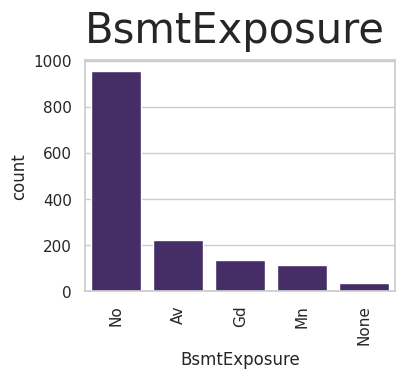

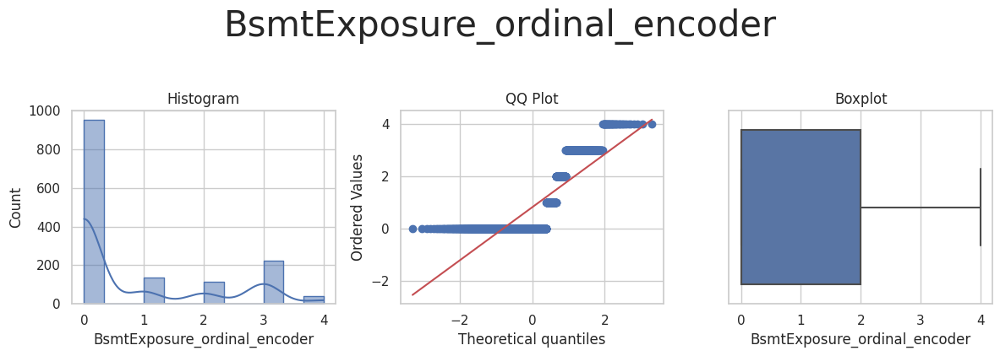



* Variable Analyzed: BsmtFinType1
* Applied transformation: ['BsmtFinType1_ordinal_encoder'] 



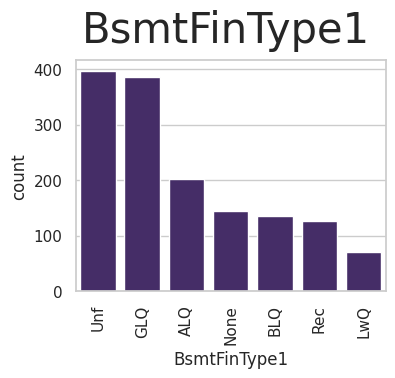

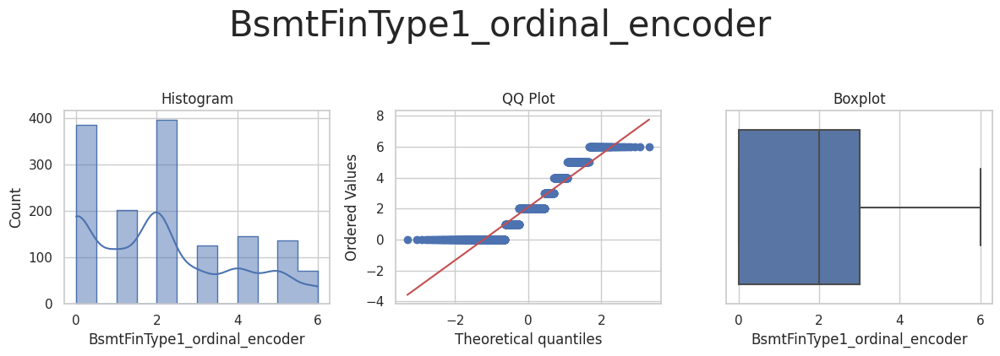



* Variable Analyzed: GarageFinish
* Applied transformation: ['GarageFinish_ordinal_encoder'] 



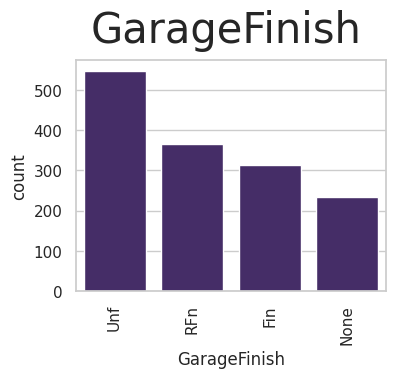

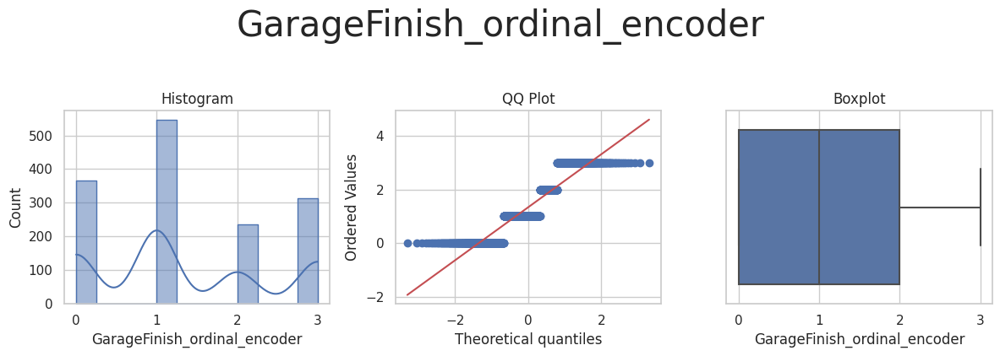



* Variable Analyzed: KitchenQual
* Applied transformation: ['KitchenQual_ordinal_encoder'] 



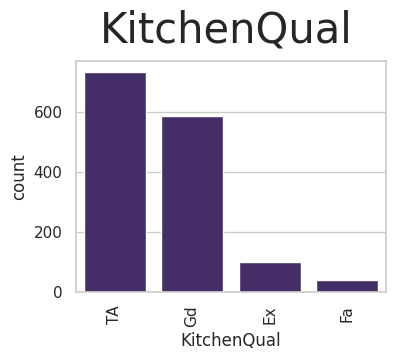

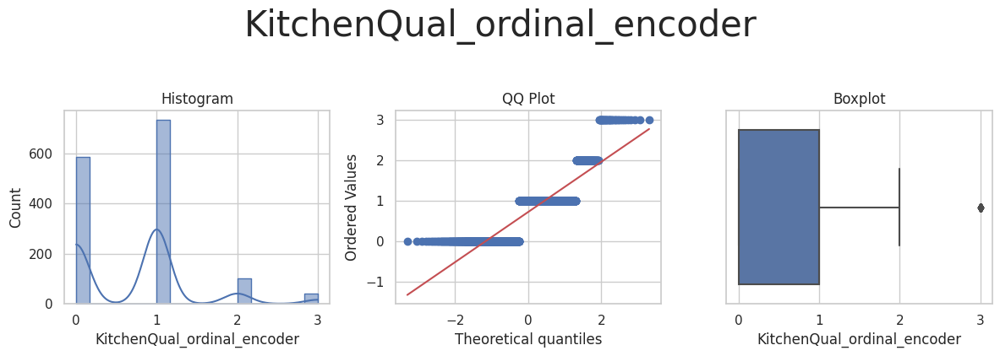

In [7]:
ordinal_variables_engineering = FeatureEngineeringAnalysis(df=ordinal_variables_engineering, analysis_type='ordinal_encoder')

We can conclude that applying the ordinal encoder will not significantly affect the distribution and range of the variables. We can use this encoder on 'BsmtExposure', 'BsmtFinType1' and 'GarageFinish', 'KitchenQual'. 

#### Numerical variables

We can explore the effects of numerical encoding on the remaining variables using the same function. Our objective is to make the distribution as close to normal distribution as possible.

In [8]:
numerical_variables = ['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr', 'BsmtFinSF1', 'BsmtUnfSF', 'GarageArea',
'GarageYrBlt', 'GrLivArea', 'LotArea', 'LotFrontage', 'MasVnrArea', 'OpenPorchSF', 'OverallCond', 
'OverallQual', 'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd']
numerical_variables_engineering = house_prices_clean_df[numerical_variables].copy()
numerical_variables_engineering.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   1stFlrSF      1460 non-null   int64  
 1   2ndFlrSF      1460 non-null   float64
 2   BedroomAbvGr  1460 non-null   float64
 3   BsmtFinSF1    1460 non-null   int64  
 4   BsmtUnfSF     1460 non-null   int64  
 5   GarageArea    1460 non-null   int64  
 6   GarageYrBlt   1460 non-null   float64
 7   GrLivArea     1460 non-null   int64  
 8   LotArea       1460 non-null   int64  
 9   LotFrontage   1460 non-null   float64
 10  MasVnrArea    1460 non-null   float64
 11  OpenPorchSF   1460 non-null   int64  
 12  OverallCond   1460 non-null   int64  
 13  OverallQual   1460 non-null   int64  
 14  TotalBsmtSF   1460 non-null   int64  
 15  YearBuilt     1460 non-null   int64  
 16  YearRemodAdd  1460 non-null   int64  
dtypes: float64(5), int64(12)
memory usage: 194.0 KB


* Variable Analyzed: 1stFlrSF
* Applied transformation: ['1stFlrSF_log_e', '1stFlrSF_log_10', '1stFlrSF_reciprocal', '1stFlrSF_power', '1stFlrSF_box_cox', '1stFlrSF_yeo_johnson'] 



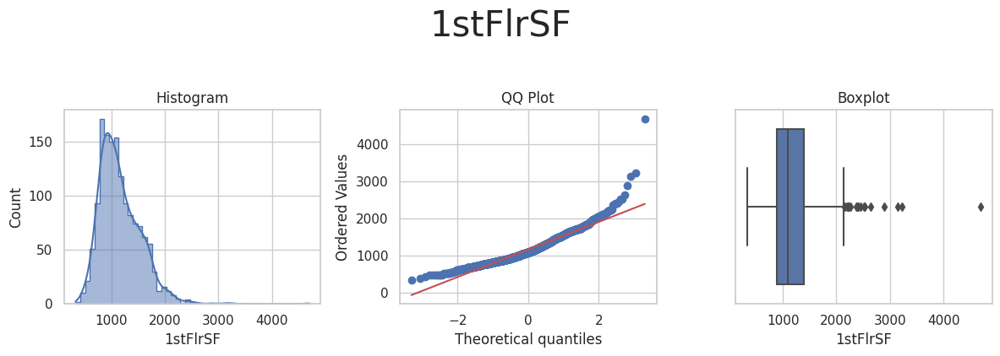

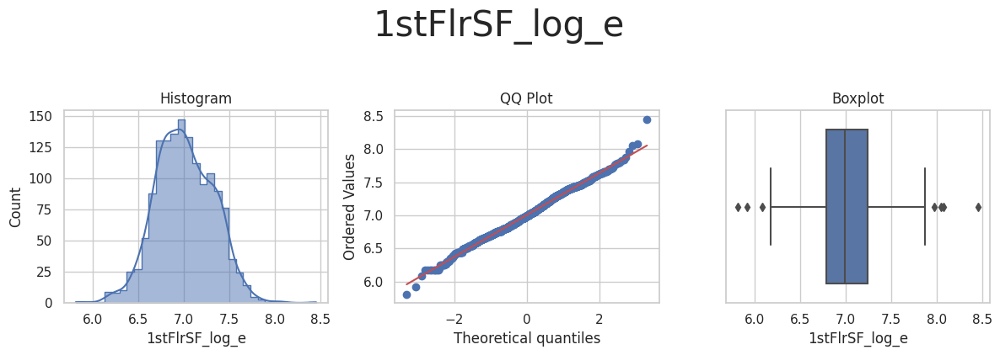

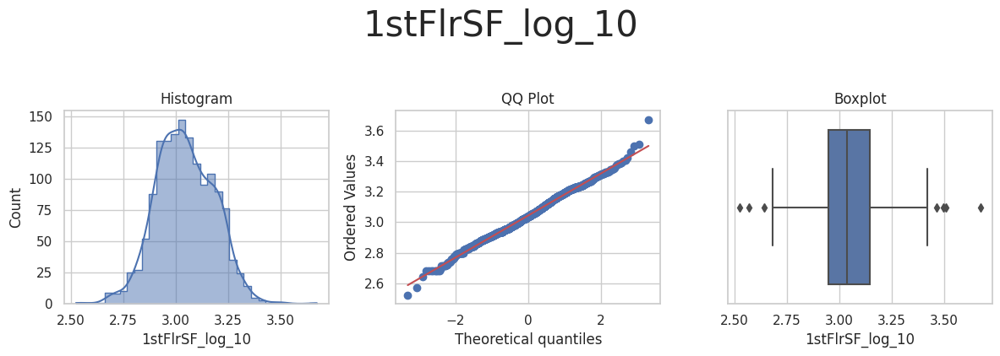

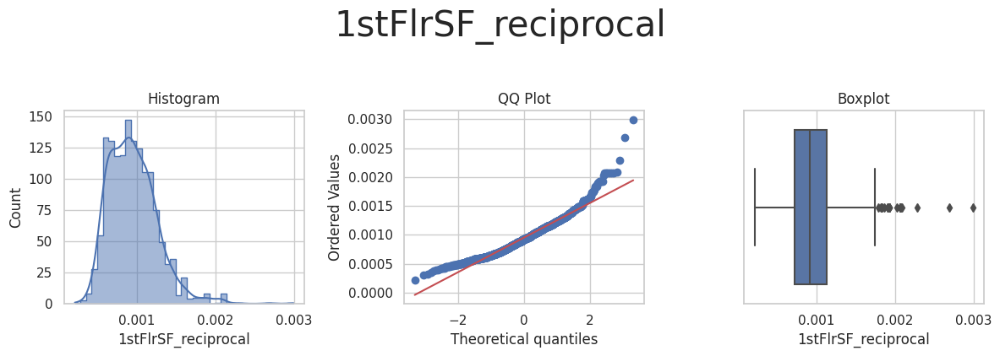

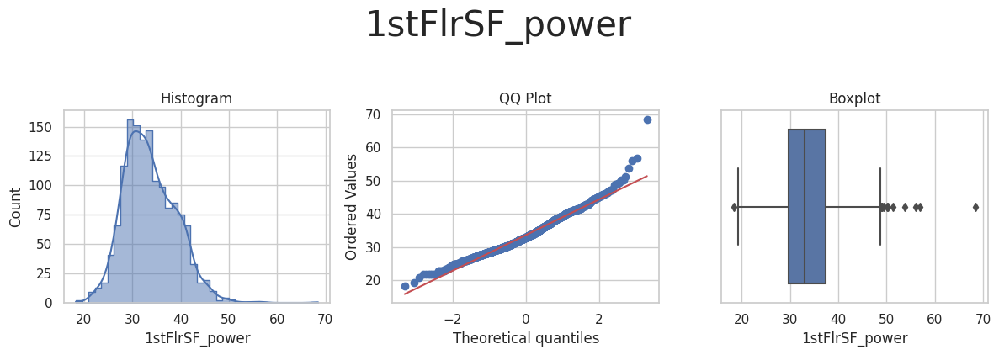

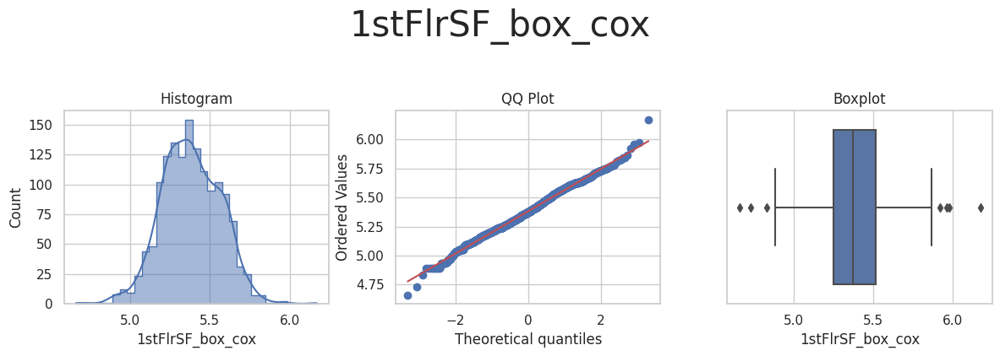

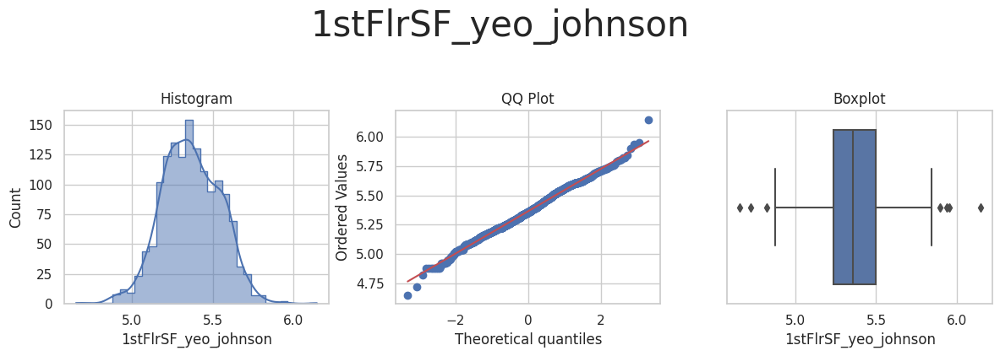



* Variable Analyzed: 2ndFlrSF
* Applied transformation: ['2ndFlrSF_power', '2ndFlrSF_yeo_johnson'] 



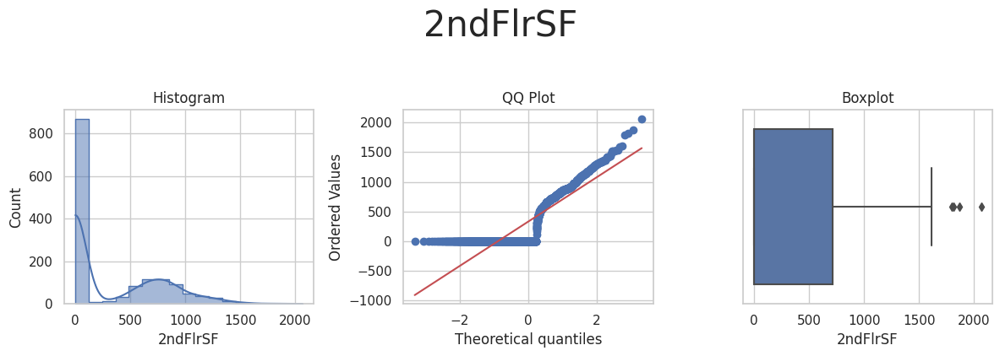

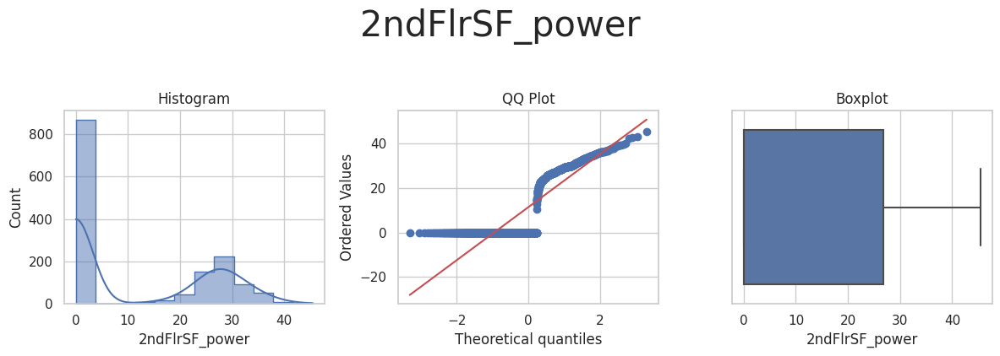

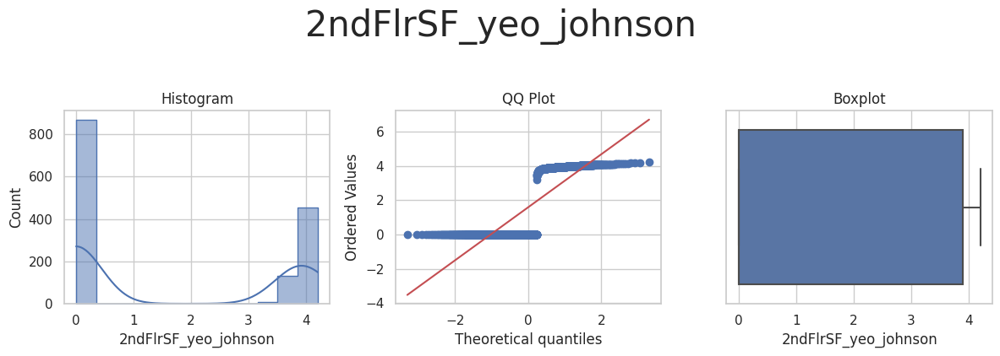



* Variable Analyzed: BedroomAbvGr
* Applied transformation: ['BedroomAbvGr_power', 'BedroomAbvGr_yeo_johnson'] 



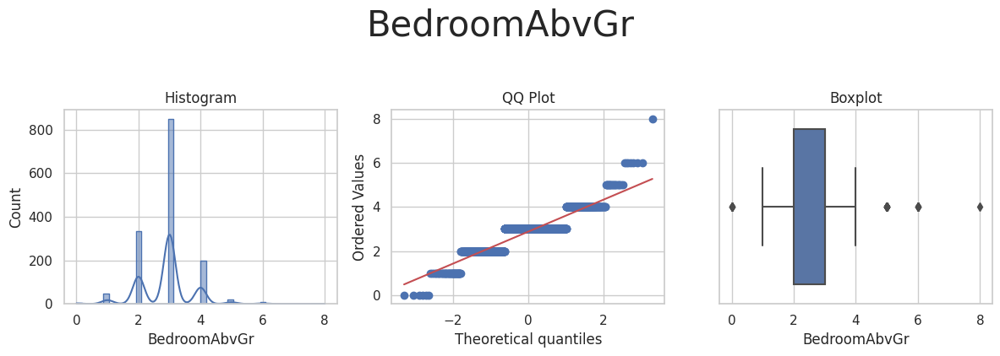

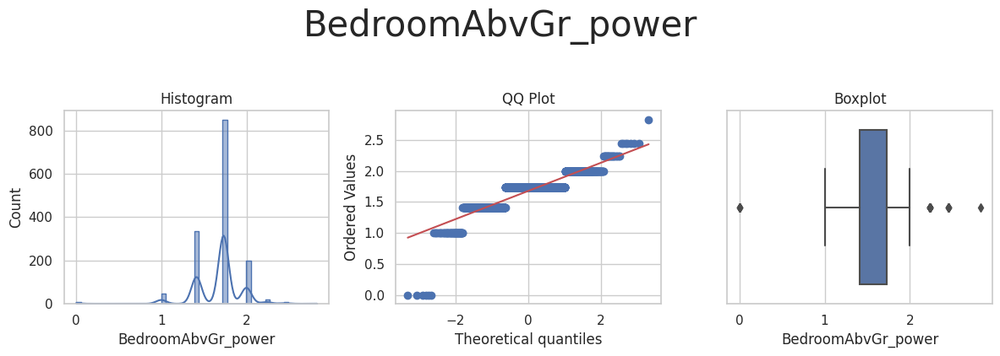

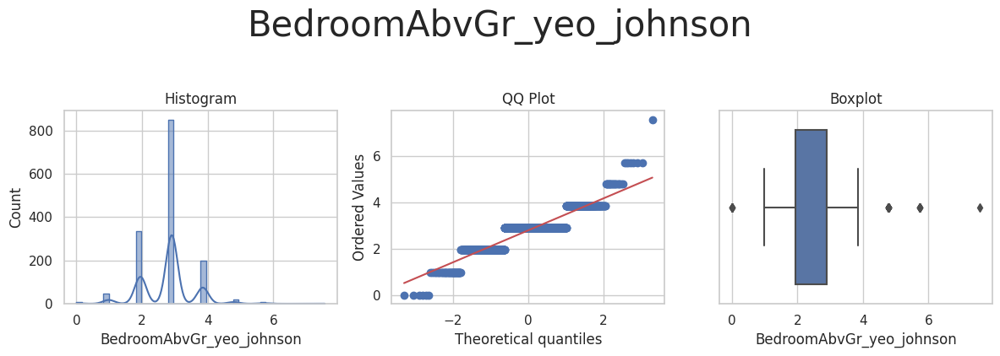



* Variable Analyzed: BsmtFinSF1
* Applied transformation: ['BsmtFinSF1_power', 'BsmtFinSF1_yeo_johnson'] 



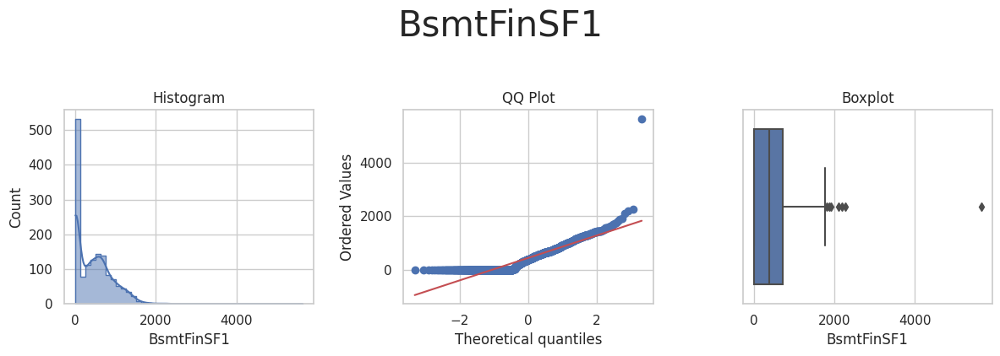

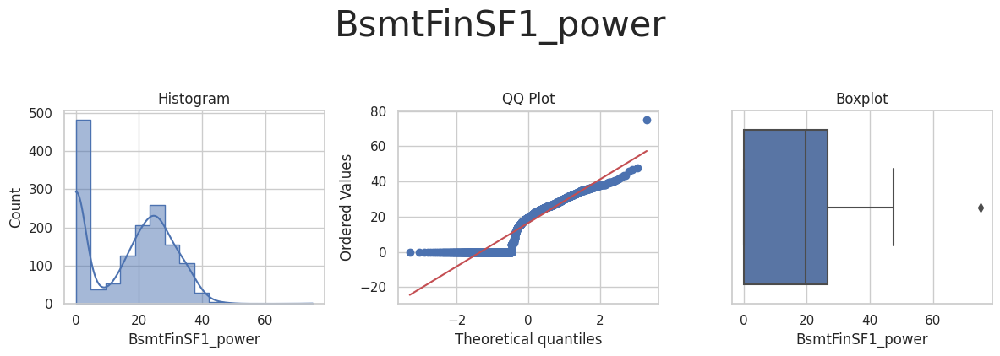

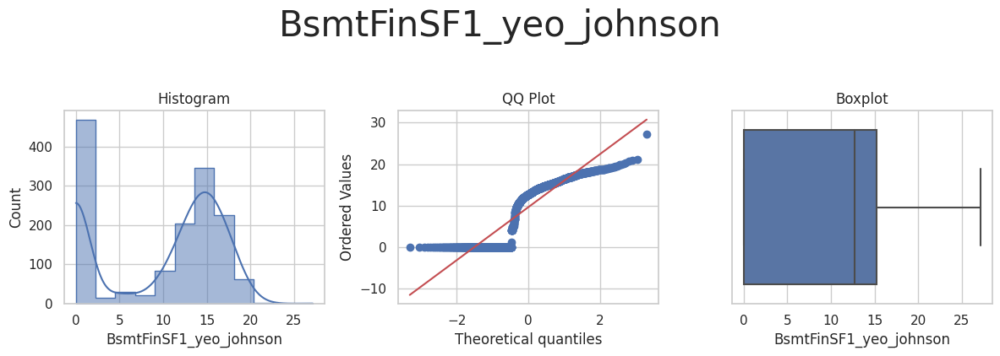



* Variable Analyzed: BsmtUnfSF
* Applied transformation: ['BsmtUnfSF_power', 'BsmtUnfSF_yeo_johnson'] 



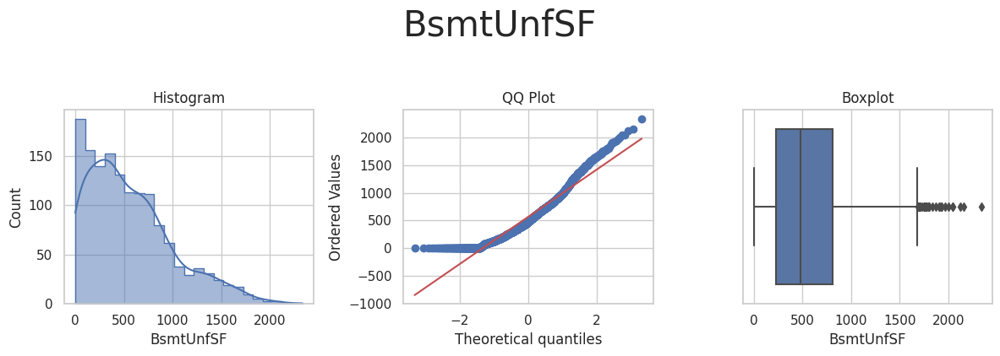

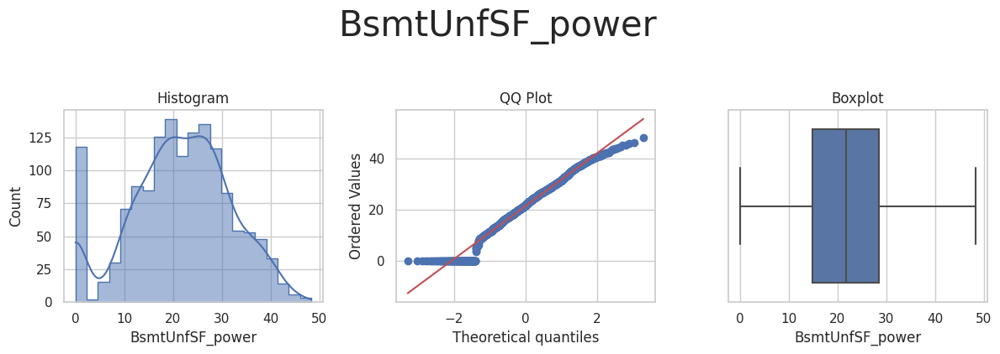

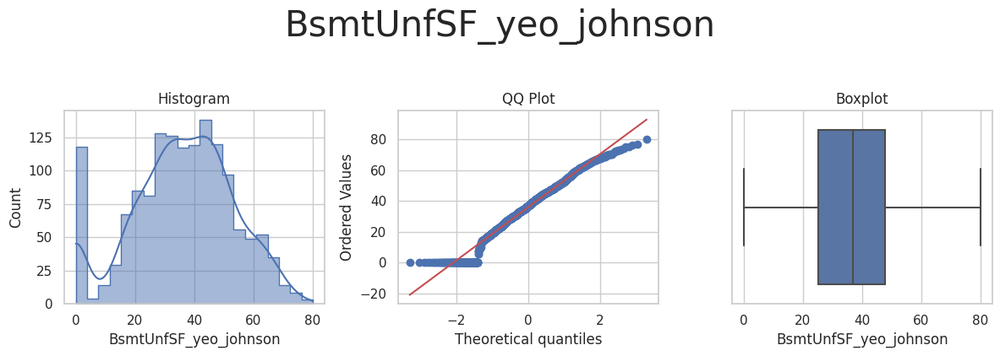



* Variable Analyzed: GarageArea
* Applied transformation: ['GarageArea_power', 'GarageArea_yeo_johnson'] 



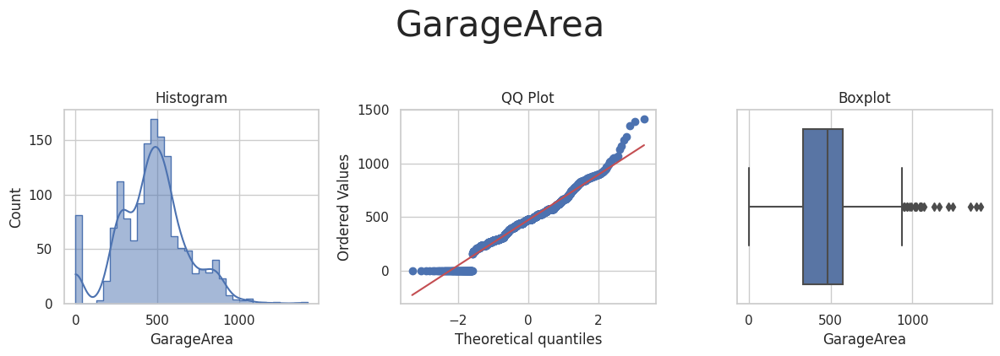

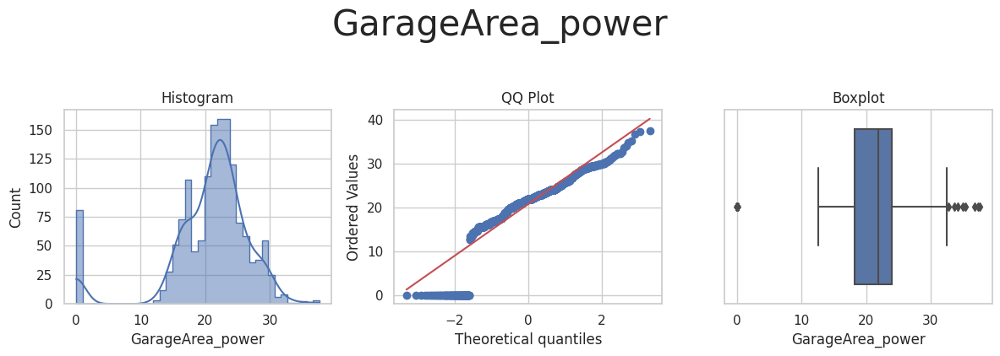

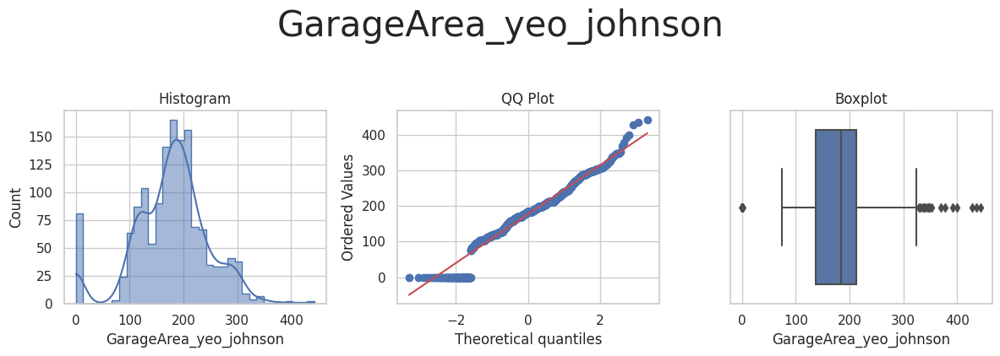



* Variable Analyzed: GarageYrBlt
* Applied transformation: ['GarageYrBlt_log_e', 'GarageYrBlt_log_10', 'GarageYrBlt_reciprocal', 'GarageYrBlt_power', 'GarageYrBlt_box_cox', 'GarageYrBlt_yeo_johnson'] 



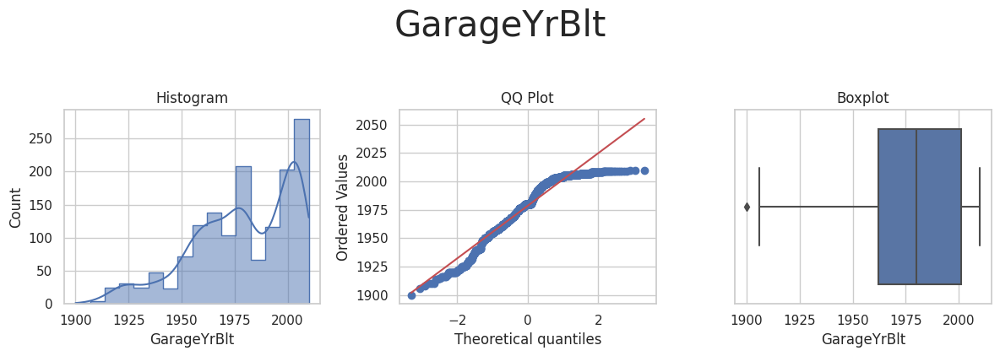

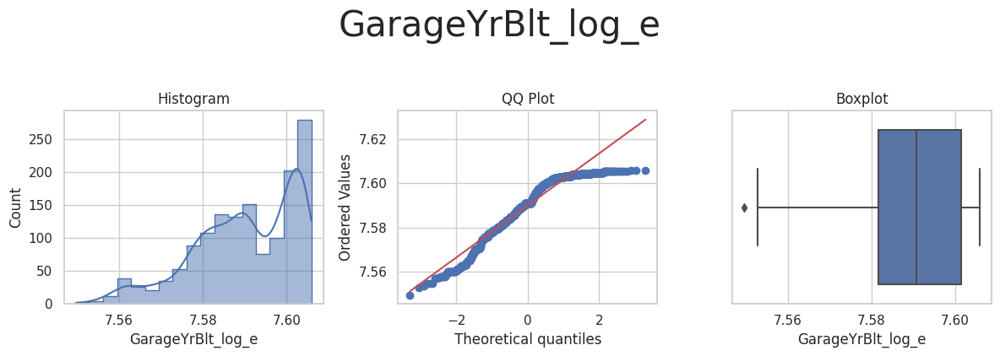

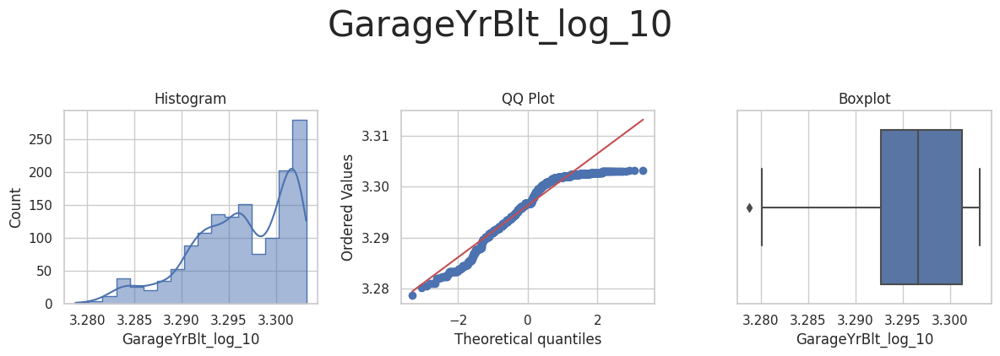

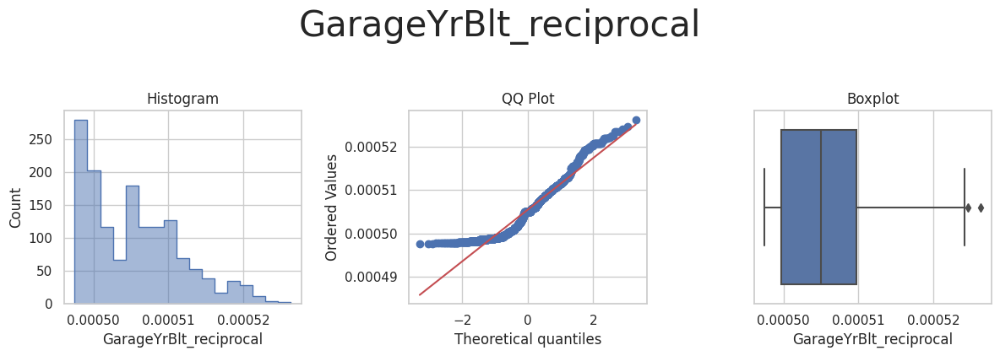

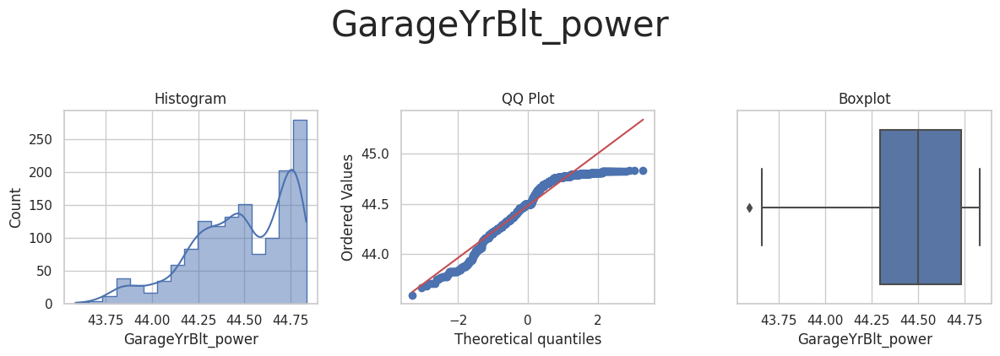

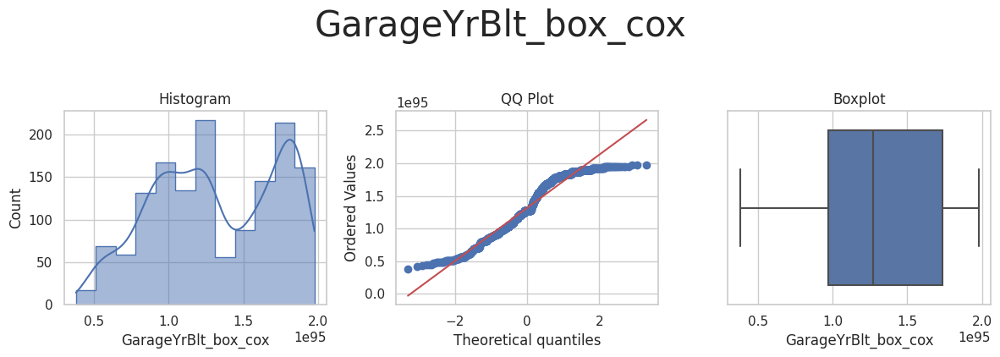

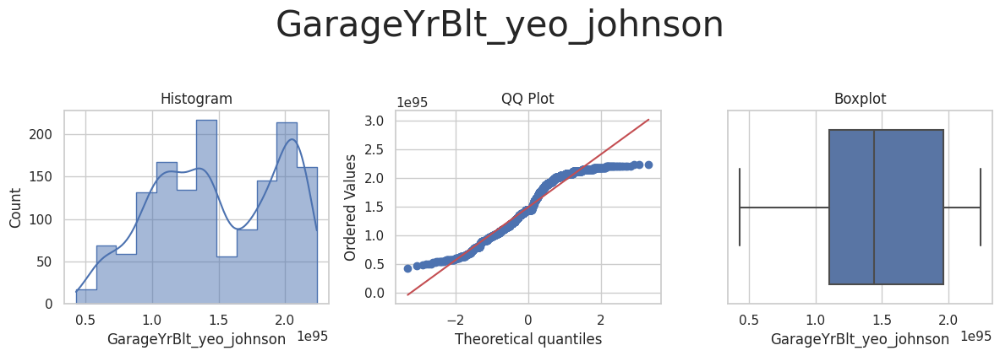



* Variable Analyzed: GrLivArea
* Applied transformation: ['GrLivArea_log_e', 'GrLivArea_log_10', 'GrLivArea_reciprocal', 'GrLivArea_power', 'GrLivArea_box_cox', 'GrLivArea_yeo_johnson'] 



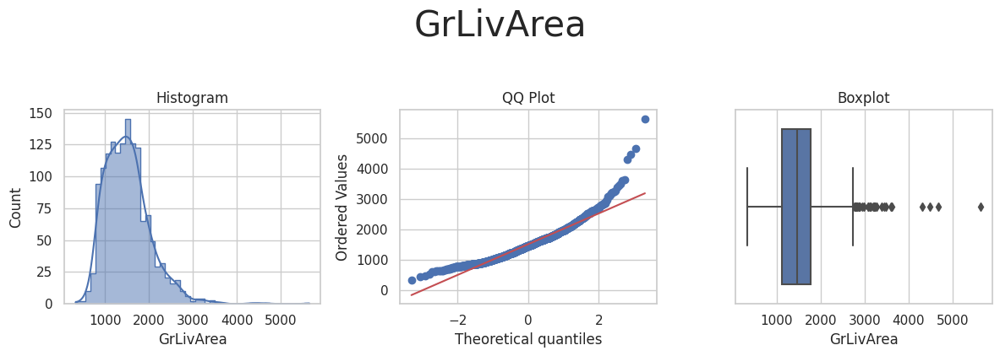

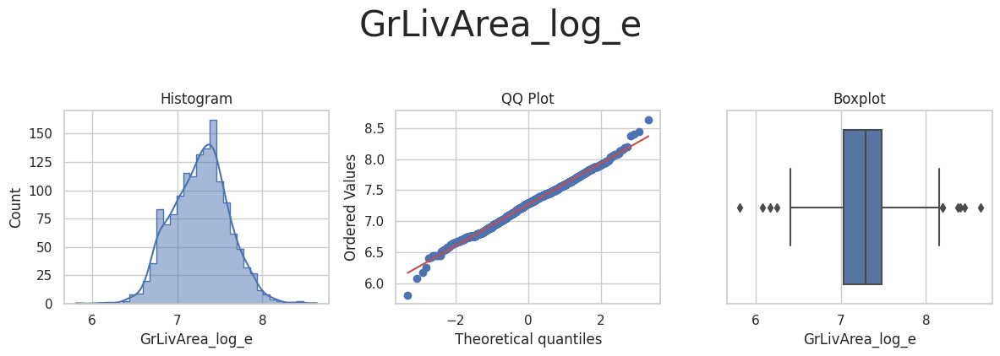

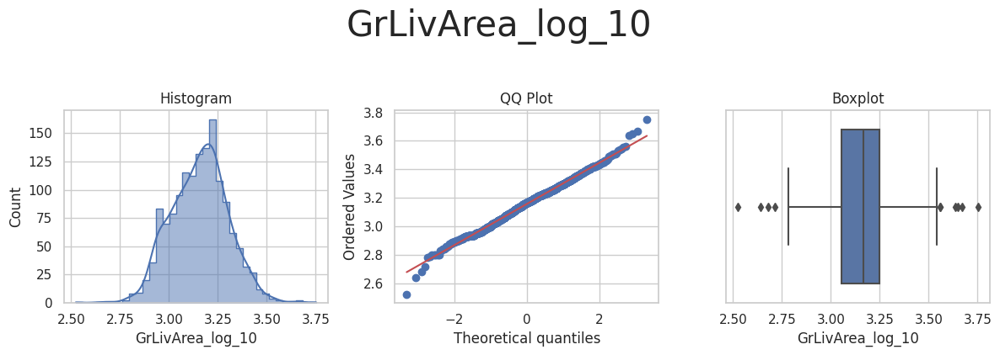

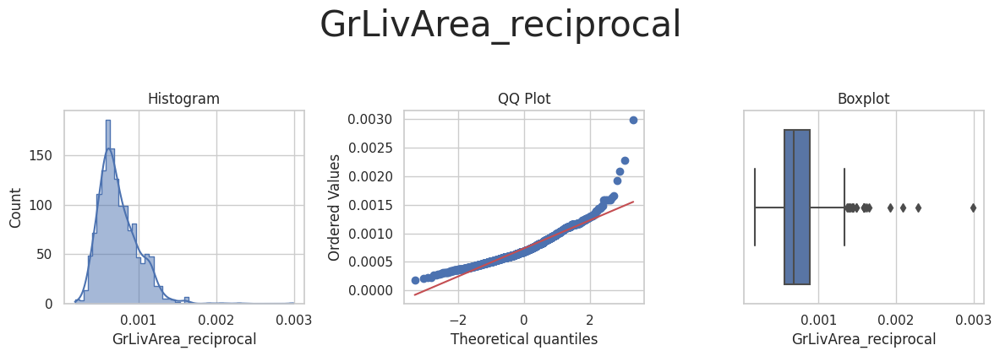

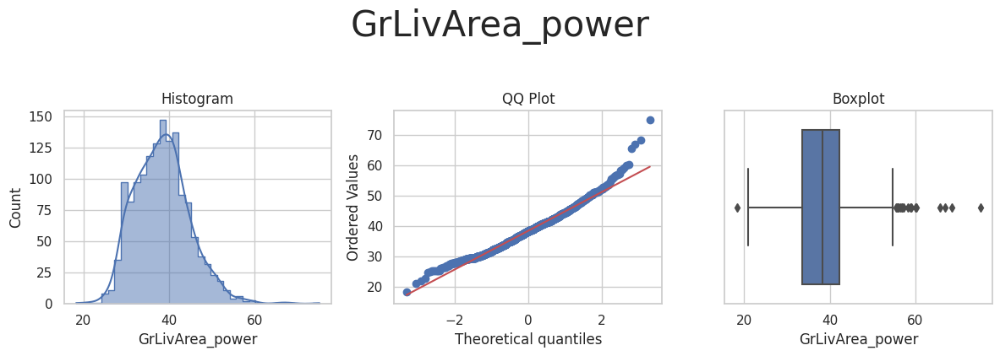

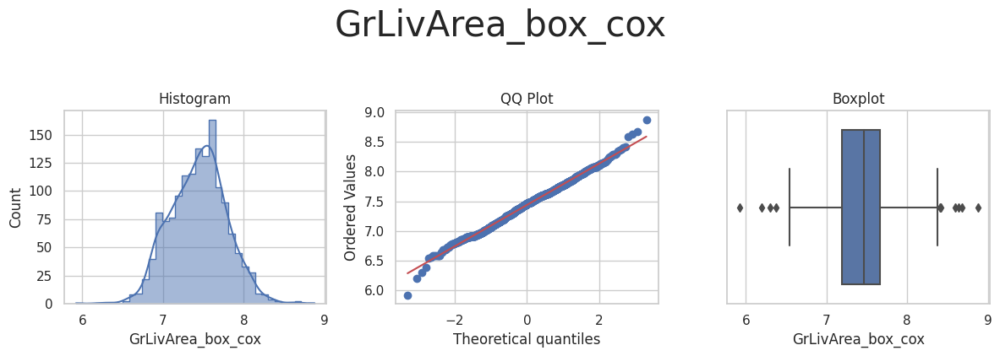

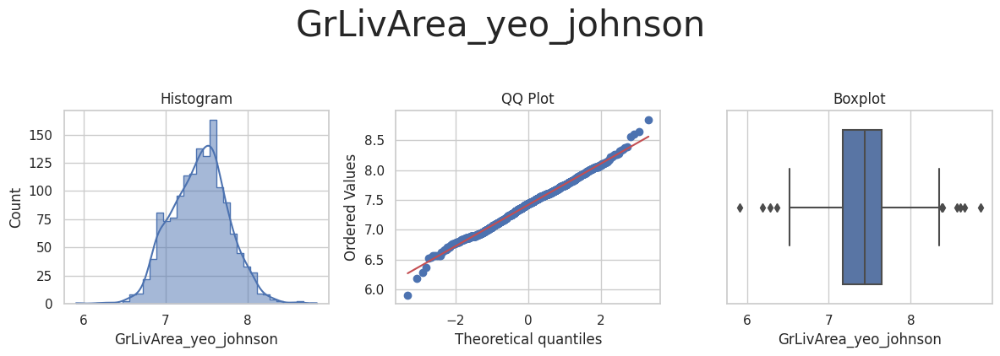



* Variable Analyzed: LotArea
* Applied transformation: ['LotArea_log_e', 'LotArea_log_10', 'LotArea_reciprocal', 'LotArea_power', 'LotArea_box_cox', 'LotArea_yeo_johnson'] 



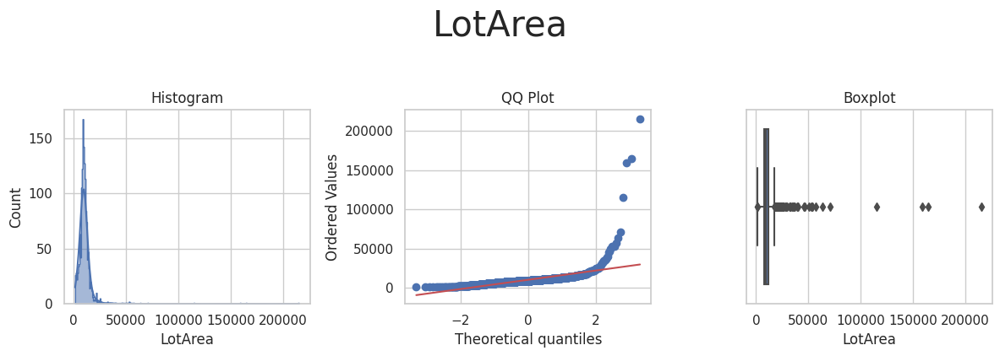

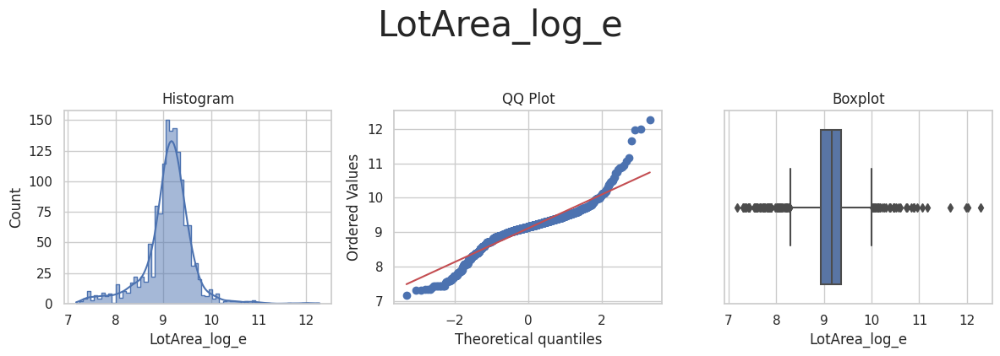

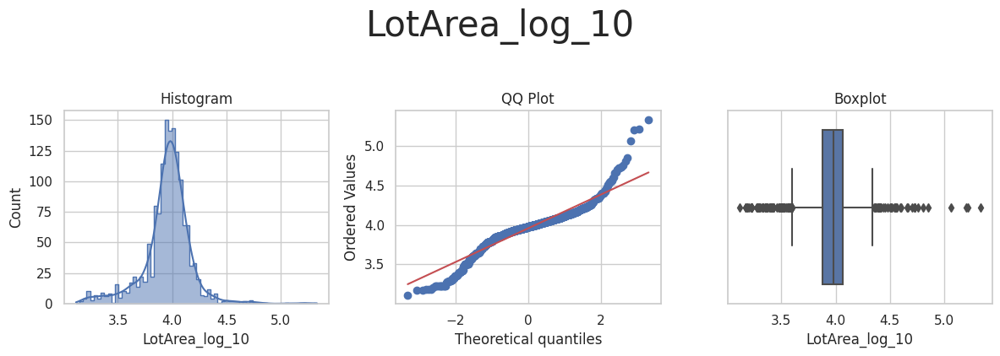

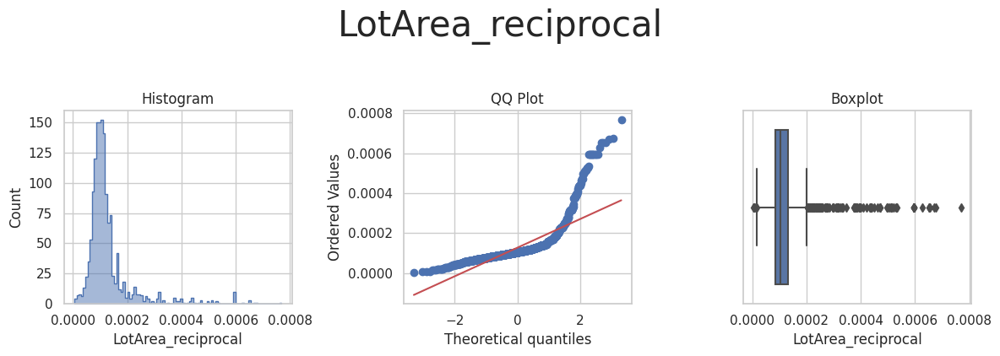

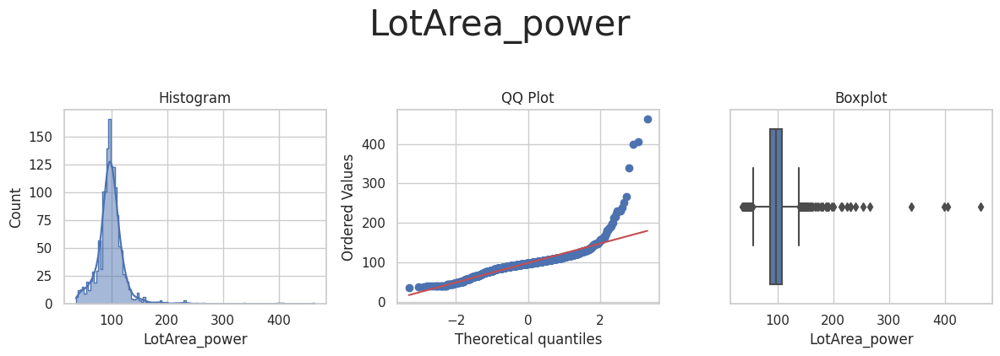

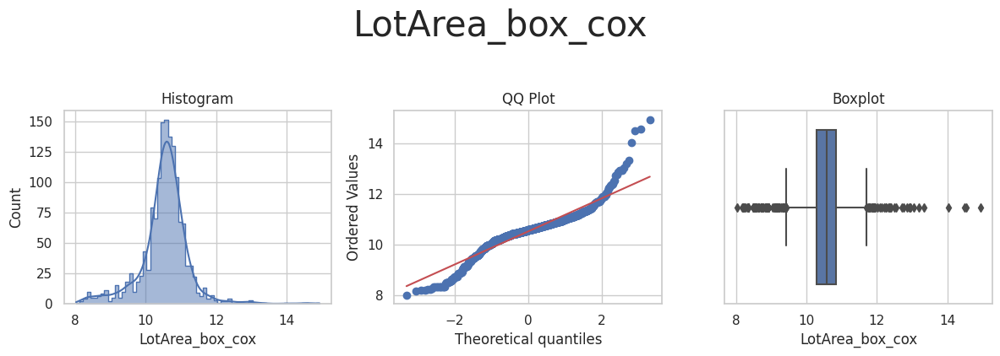

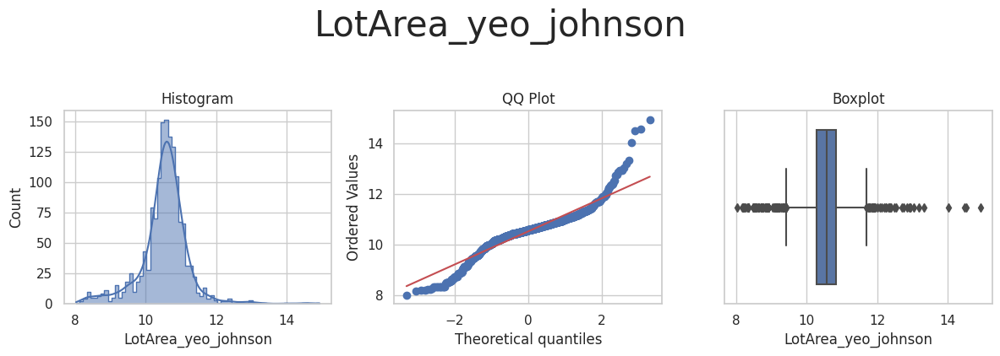



* Variable Analyzed: LotFrontage
* Applied transformation: ['LotFrontage_log_e', 'LotFrontage_log_10', 'LotFrontage_reciprocal', 'LotFrontage_power', 'LotFrontage_box_cox', 'LotFrontage_yeo_johnson'] 



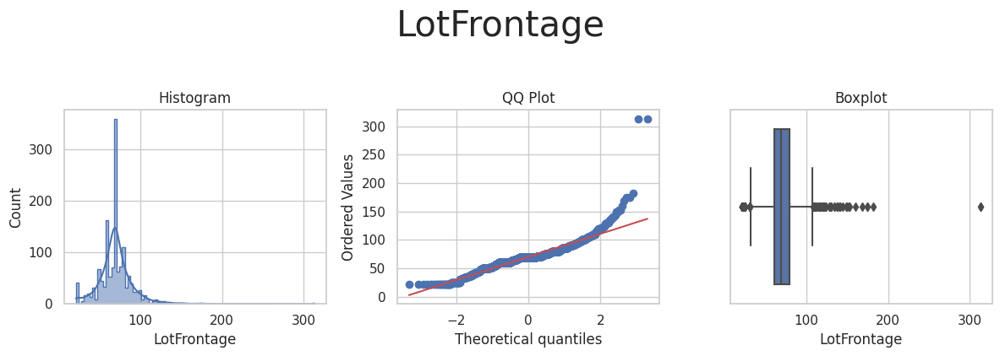

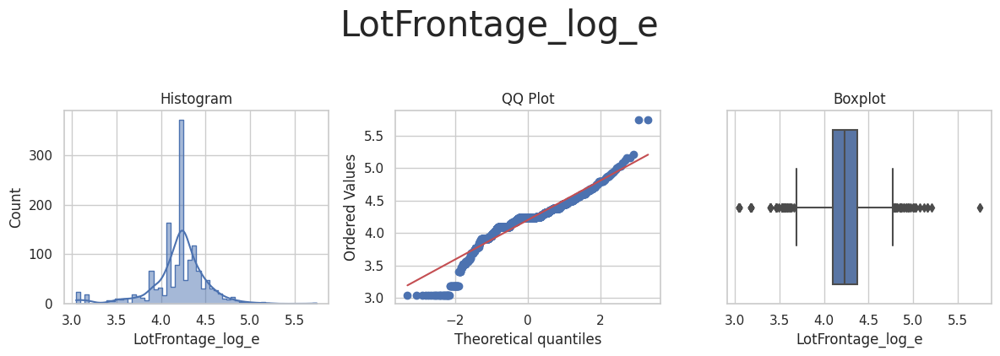

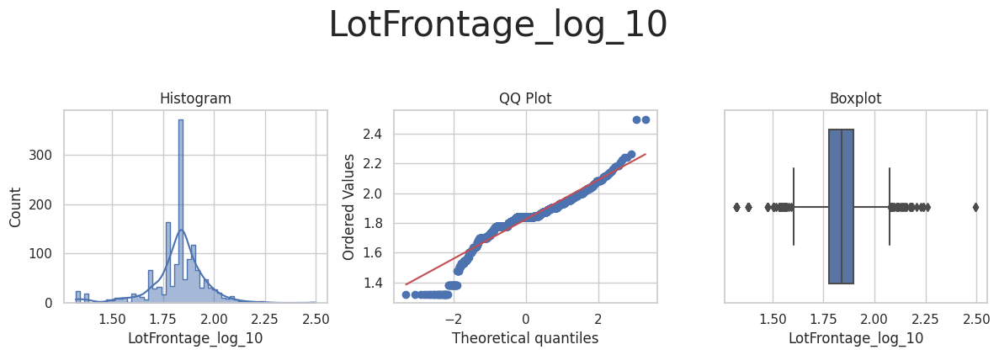

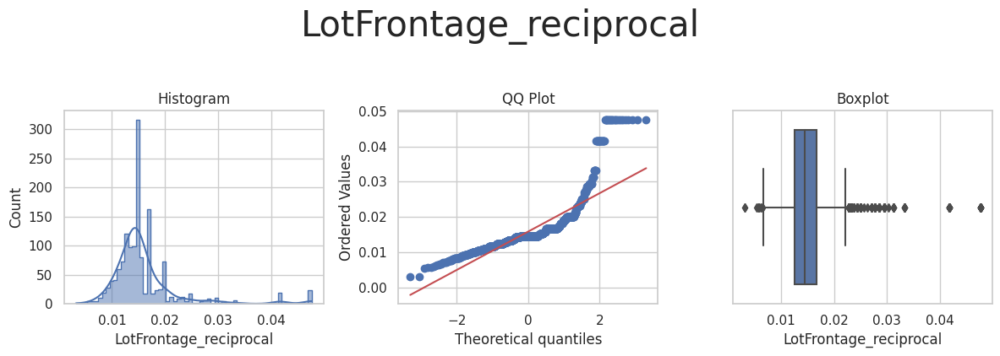

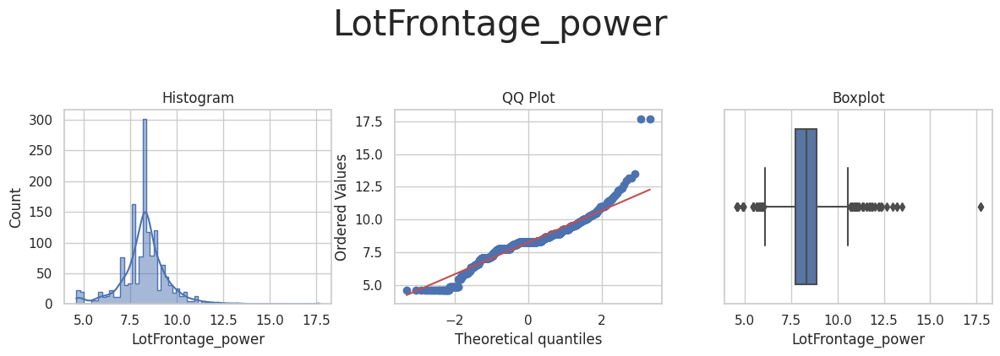

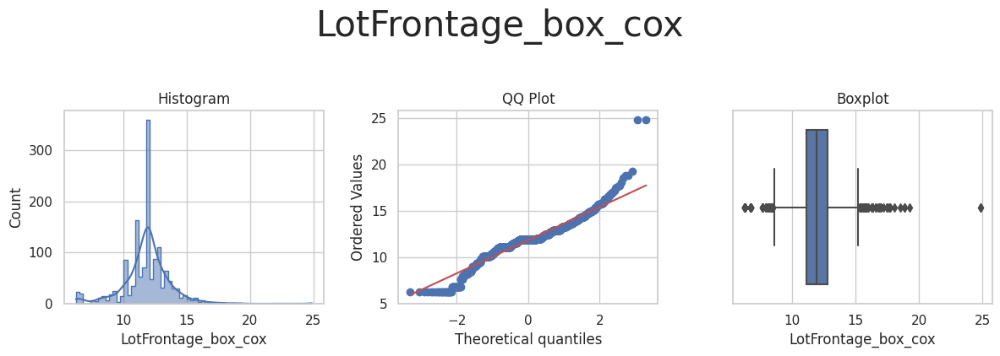

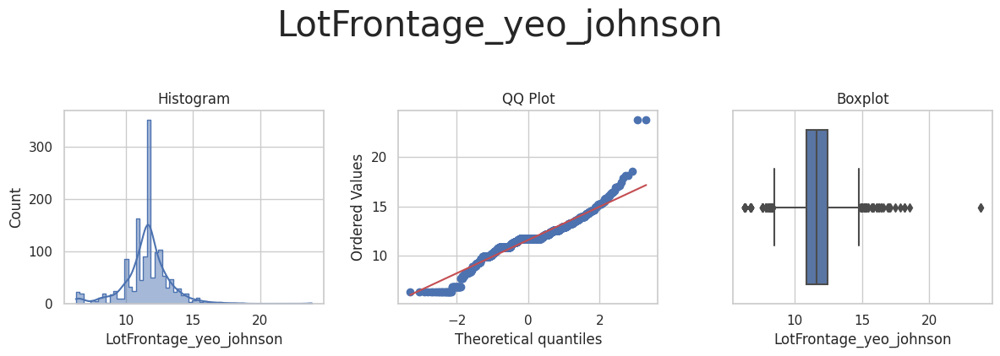



* Variable Analyzed: MasVnrArea
* Applied transformation: ['MasVnrArea_power', 'MasVnrArea_yeo_johnson'] 



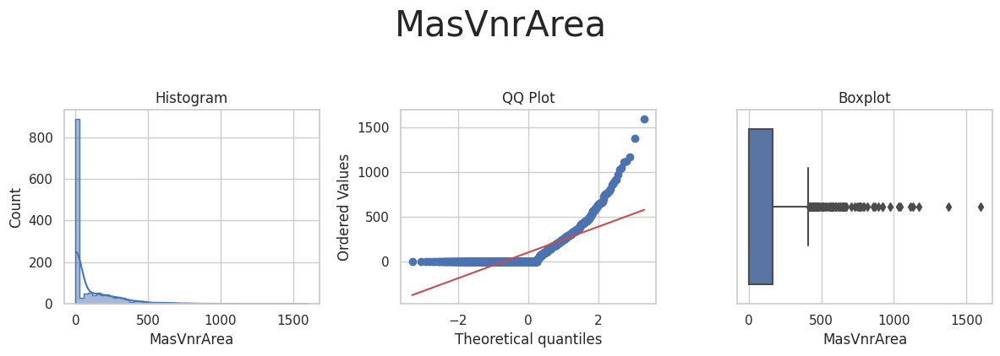

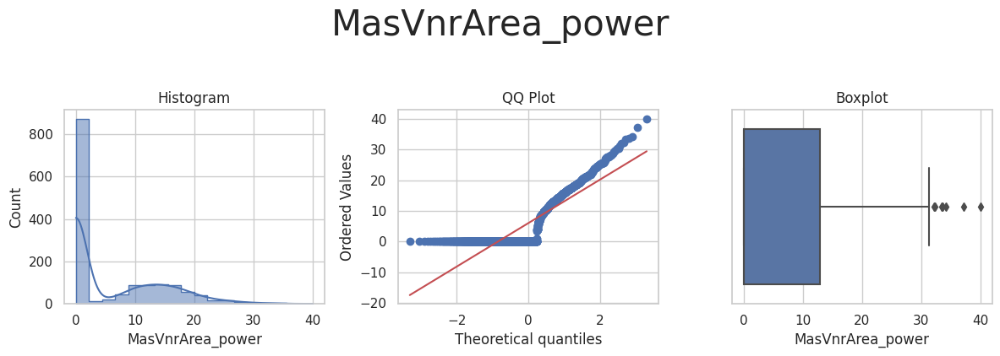

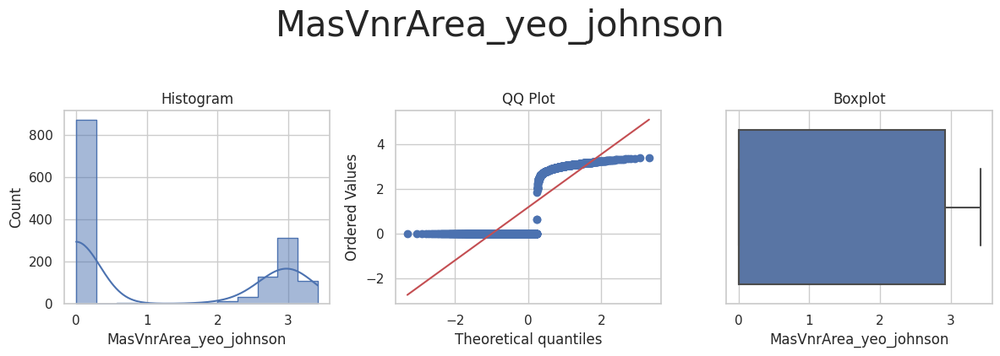



* Variable Analyzed: OpenPorchSF
* Applied transformation: ['OpenPorchSF_power', 'OpenPorchSF_yeo_johnson'] 



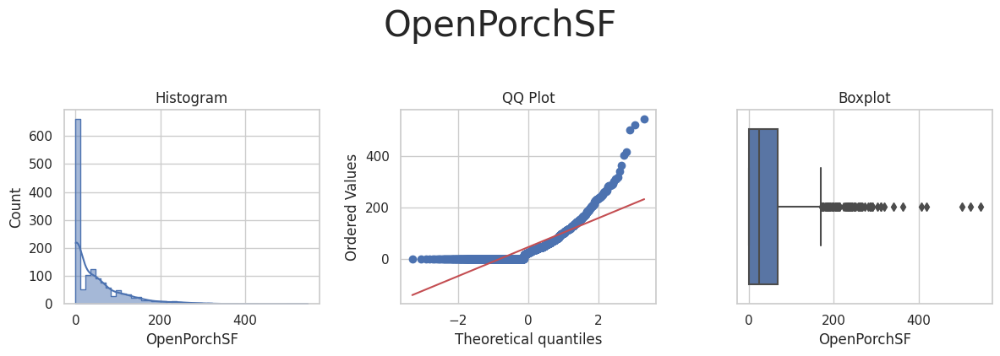

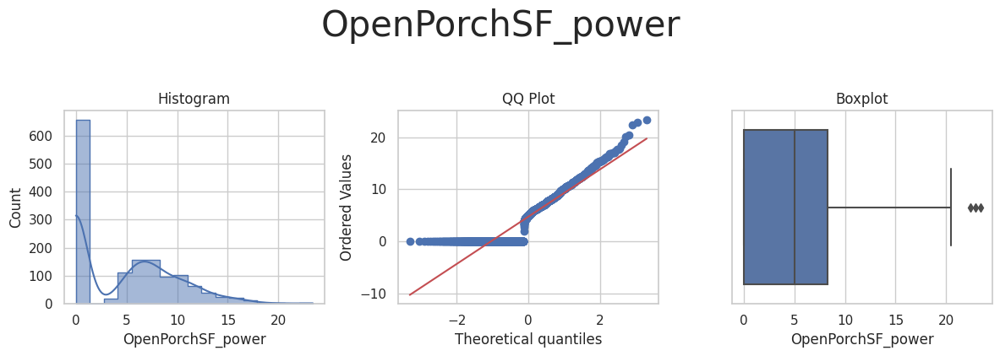

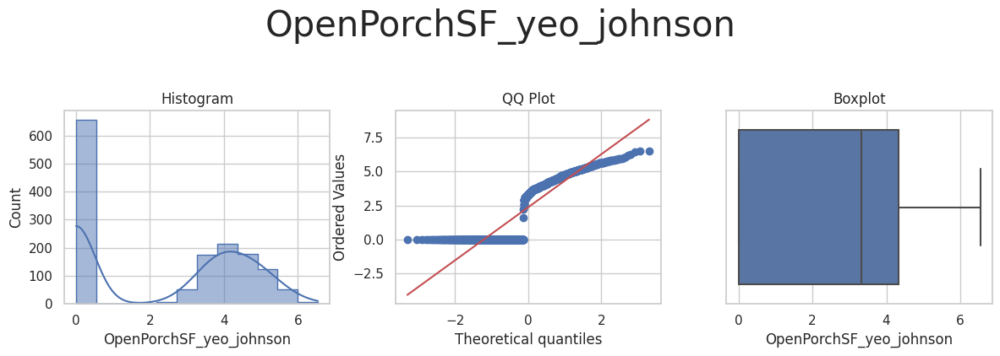



* Variable Analyzed: OverallCond
* Applied transformation: ['OverallCond_log_e', 'OverallCond_log_10', 'OverallCond_reciprocal', 'OverallCond_power', 'OverallCond_box_cox', 'OverallCond_yeo_johnson'] 



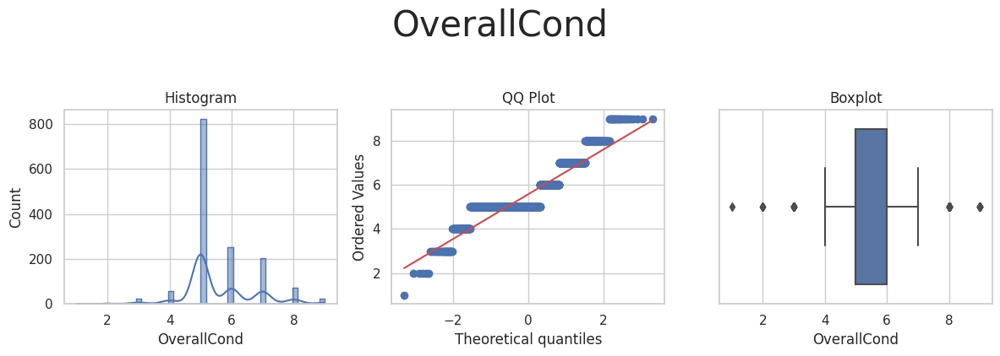

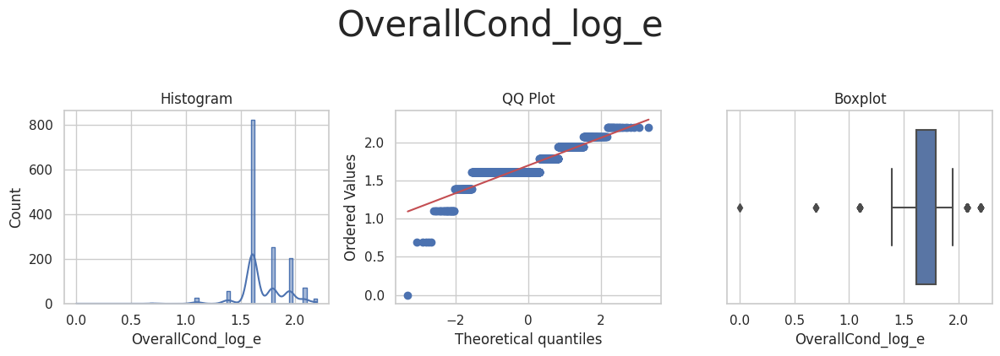

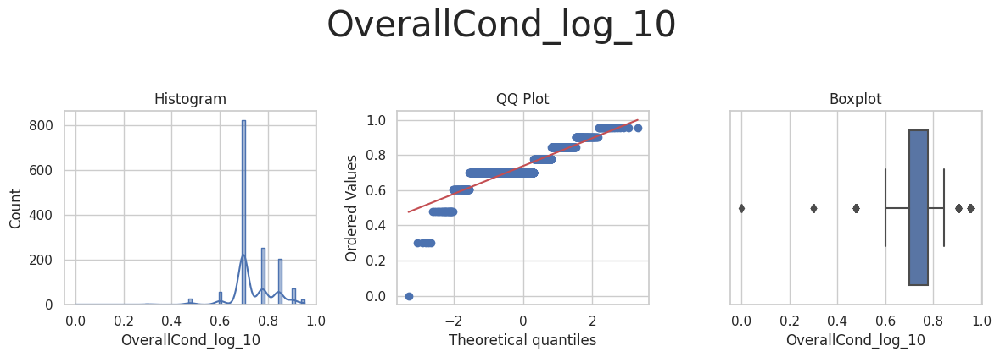

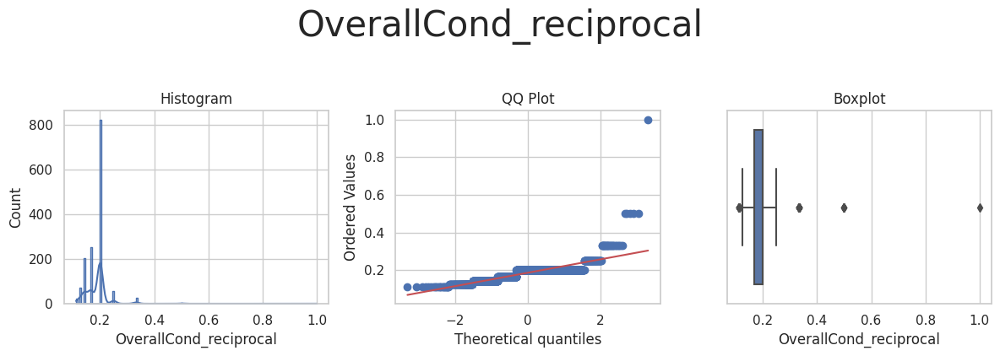

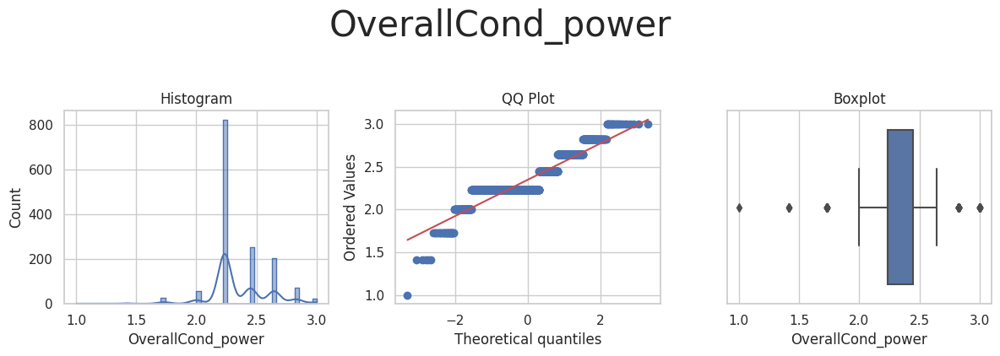

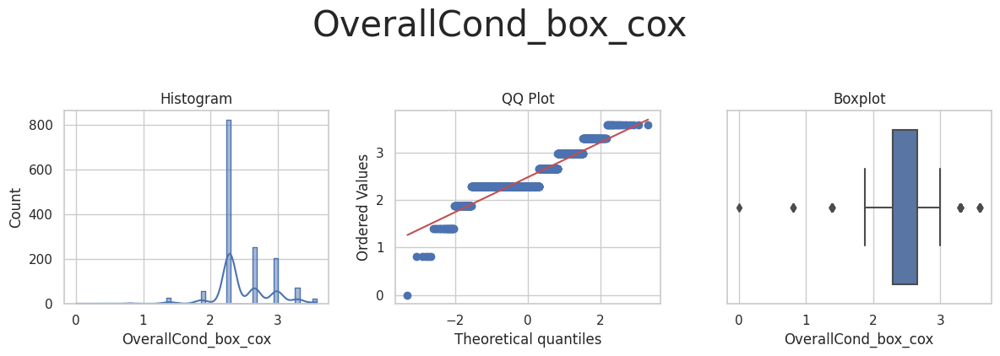

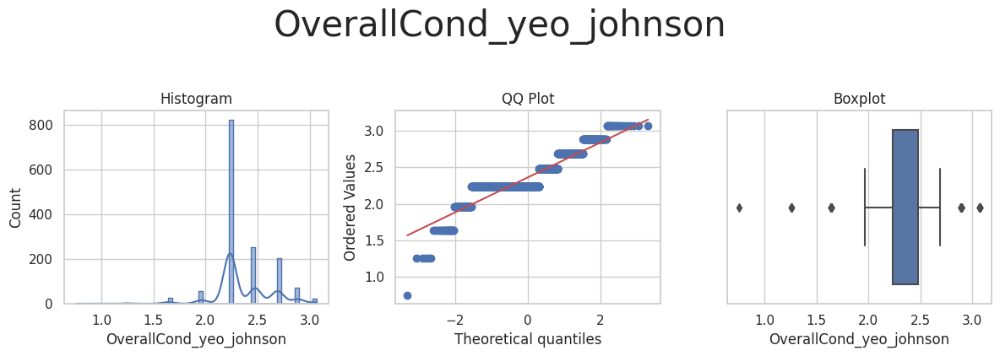



* Variable Analyzed: OverallQual
* Applied transformation: ['OverallQual_log_e', 'OverallQual_log_10', 'OverallQual_reciprocal', 'OverallQual_power', 'OverallQual_box_cox', 'OverallQual_yeo_johnson'] 



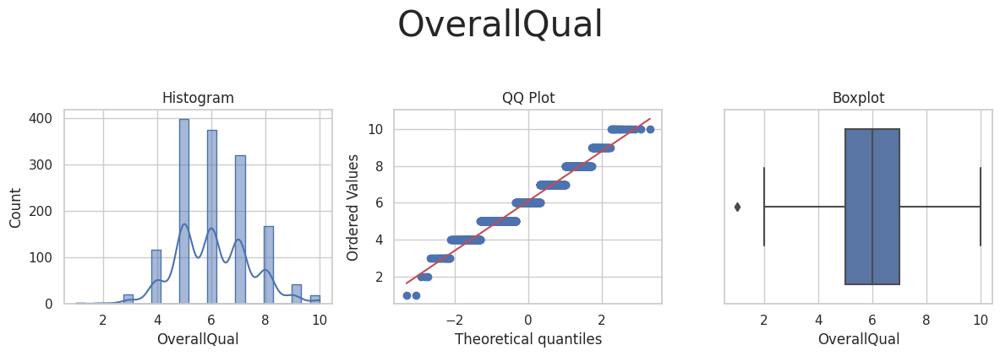

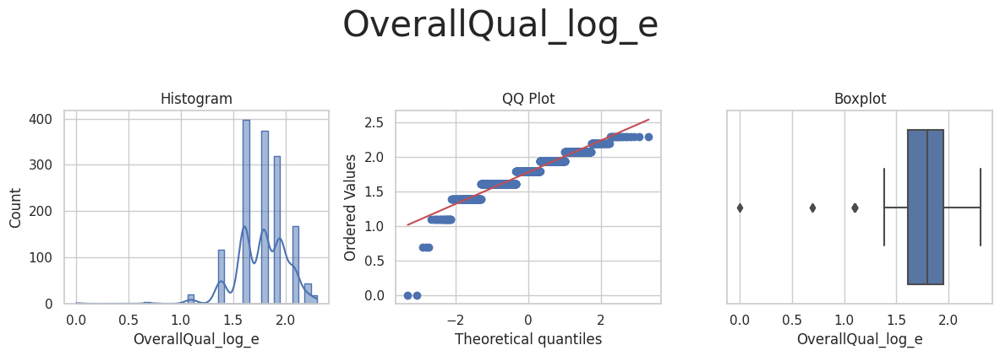

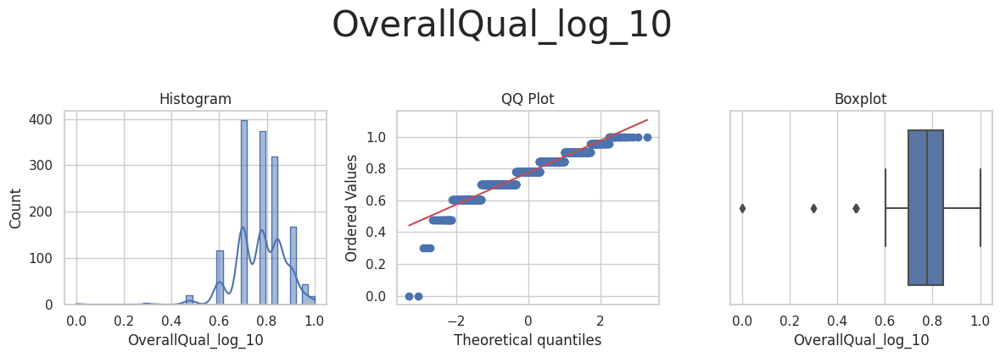

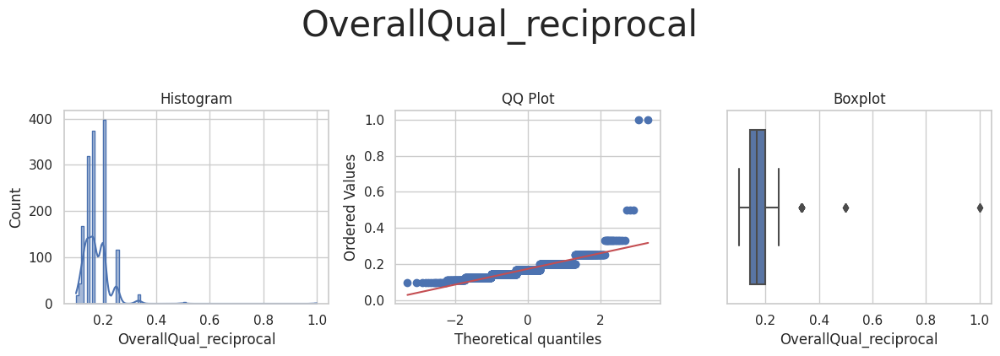

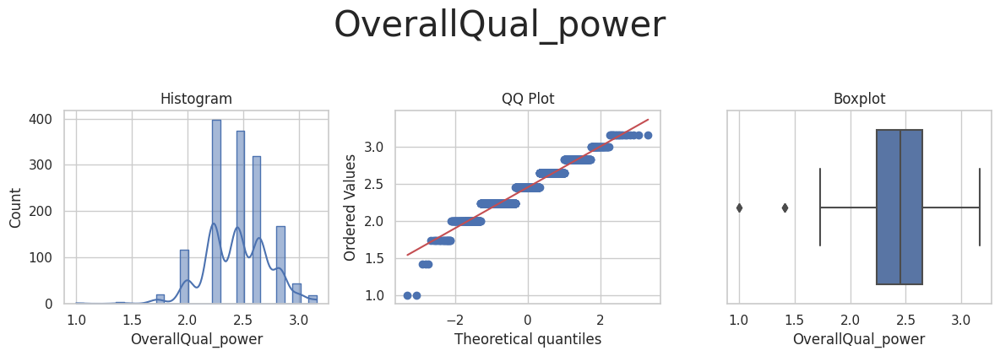

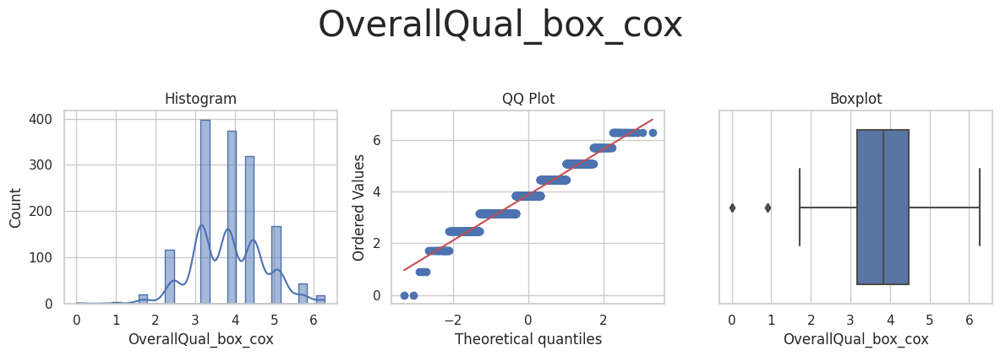

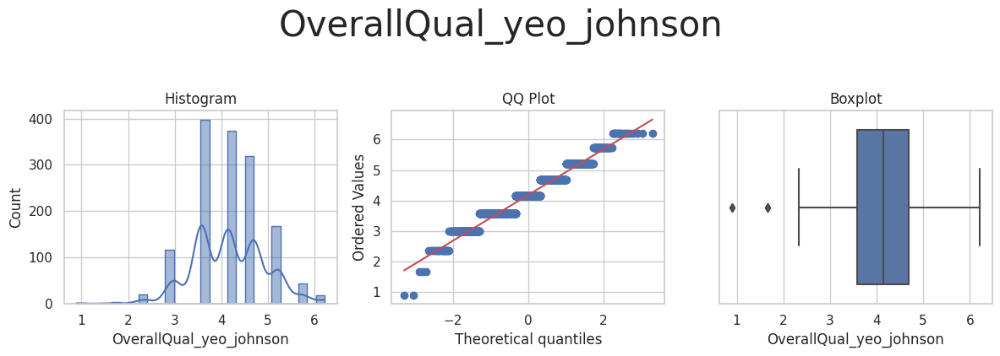



* Variable Analyzed: TotalBsmtSF
* Applied transformation: ['TotalBsmtSF_power', 'TotalBsmtSF_yeo_johnson'] 



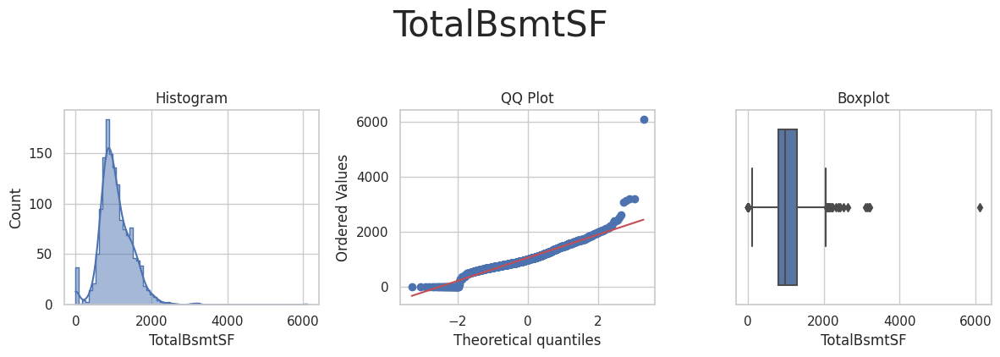

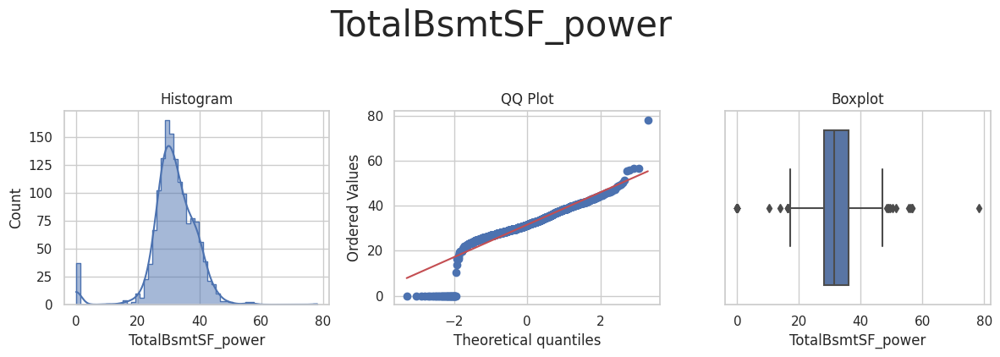

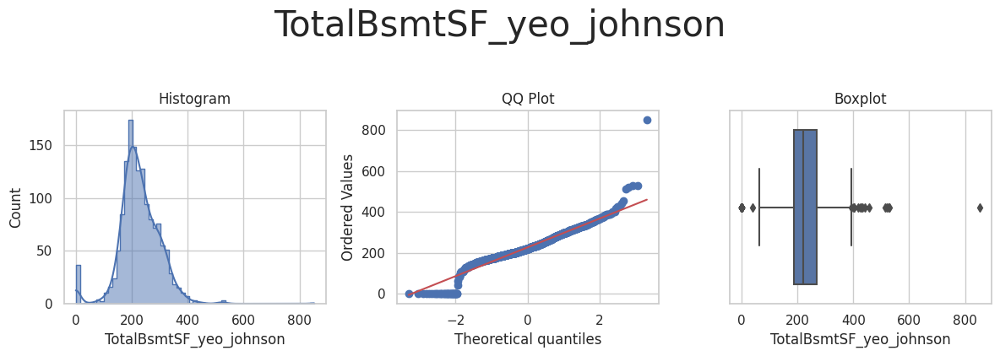



* Variable Analyzed: YearBuilt
* Applied transformation: ['YearBuilt_log_e', 'YearBuilt_log_10', 'YearBuilt_reciprocal', 'YearBuilt_power', 'YearBuilt_box_cox', 'YearBuilt_yeo_johnson'] 



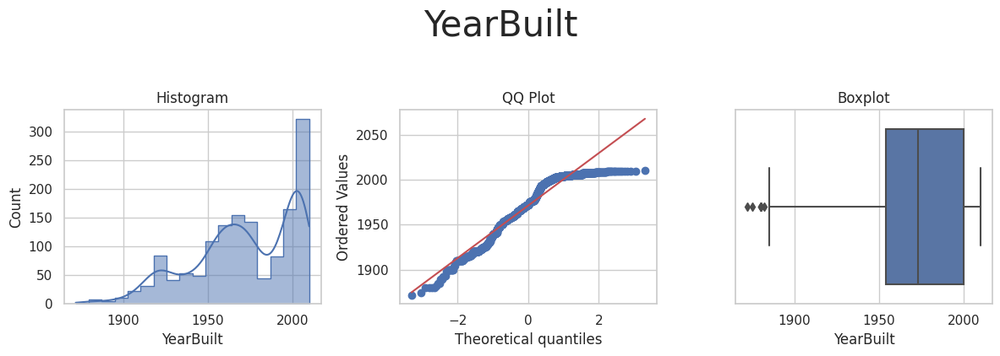

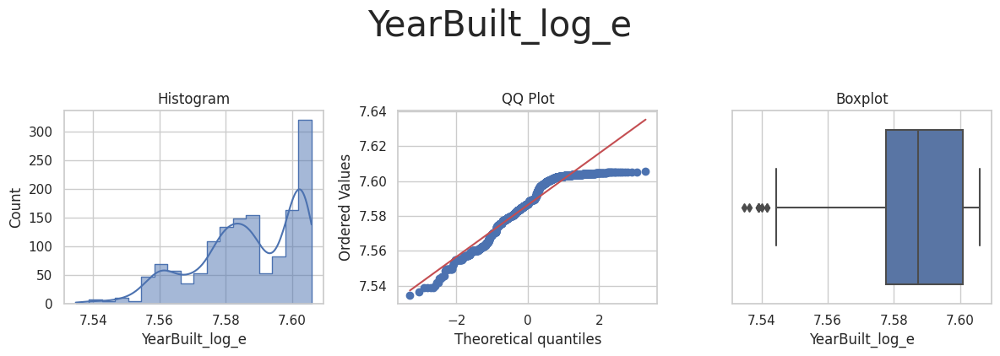

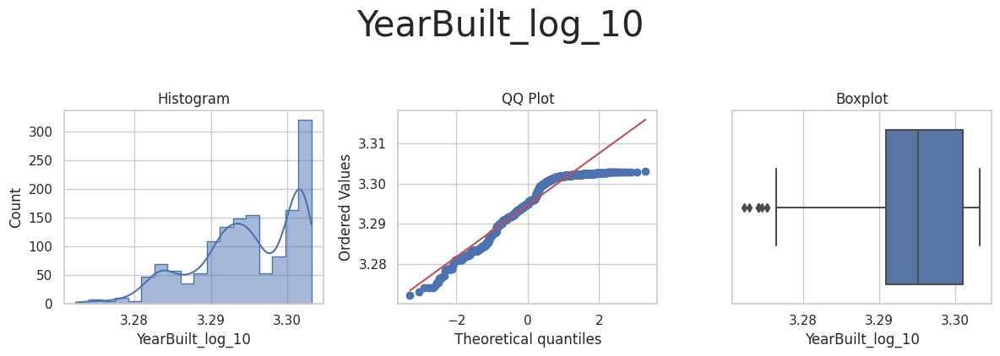

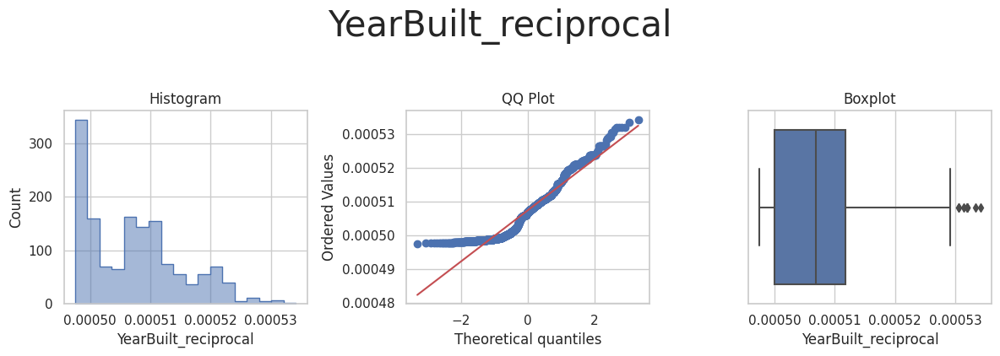

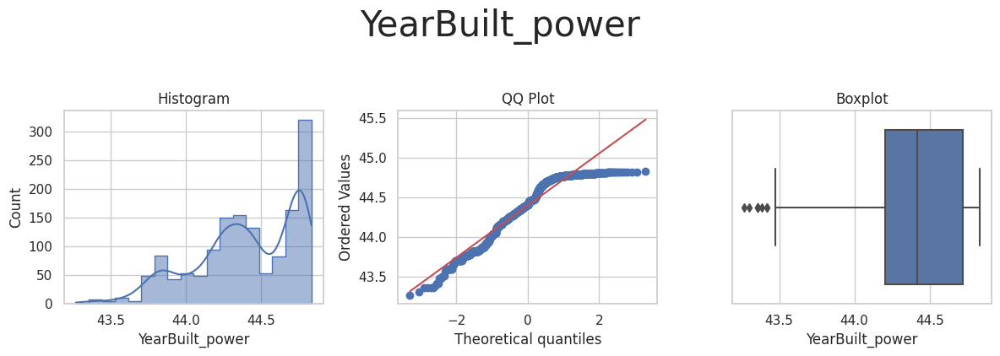

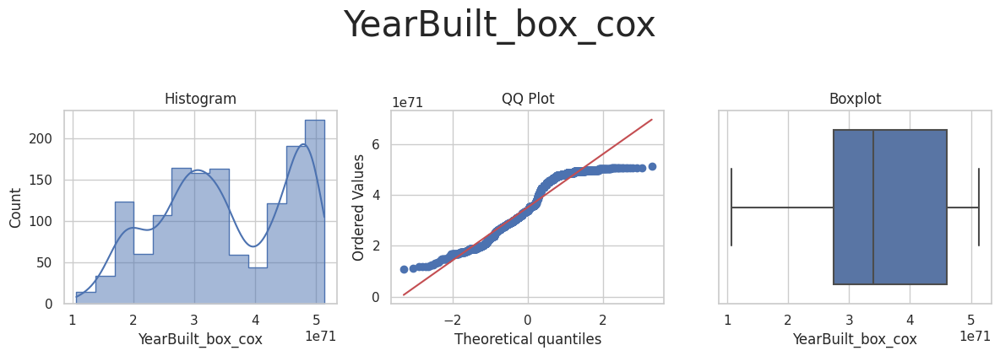

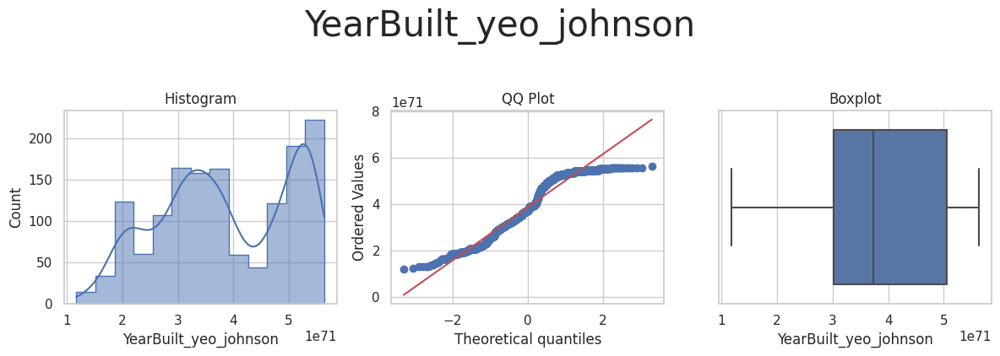



* Variable Analyzed: YearRemodAdd
* Applied transformation: ['YearRemodAdd_log_e', 'YearRemodAdd_log_10', 'YearRemodAdd_reciprocal', 'YearRemodAdd_power', 'YearRemodAdd_box_cox', 'YearRemodAdd_yeo_johnson'] 



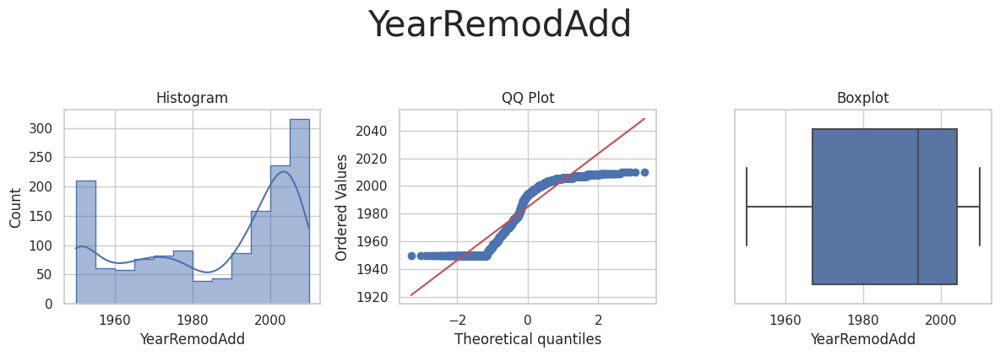

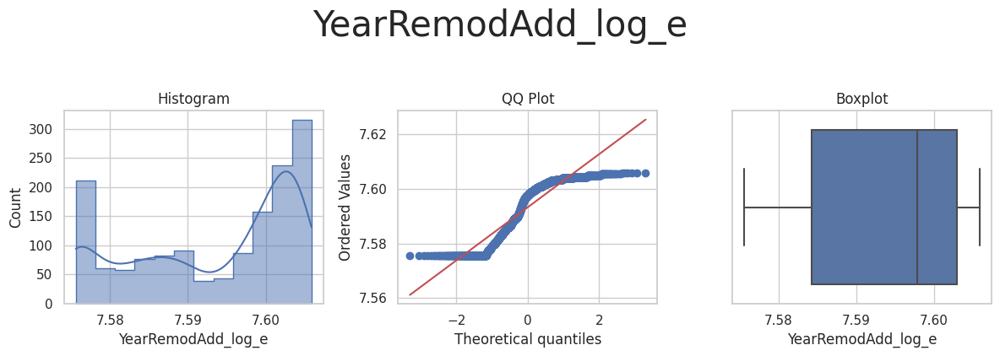

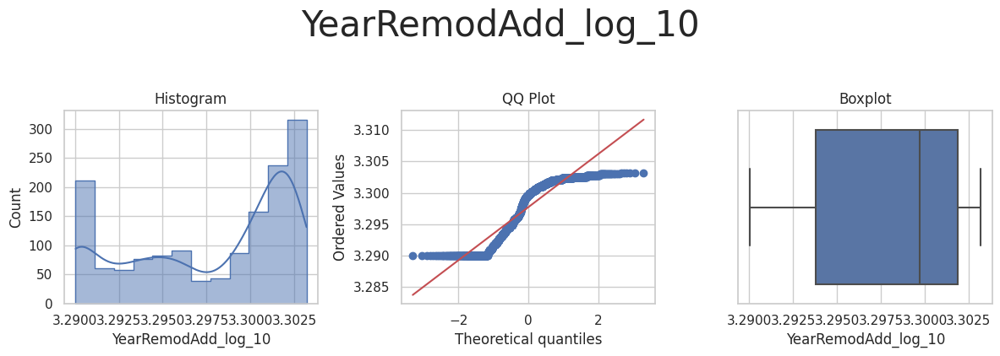

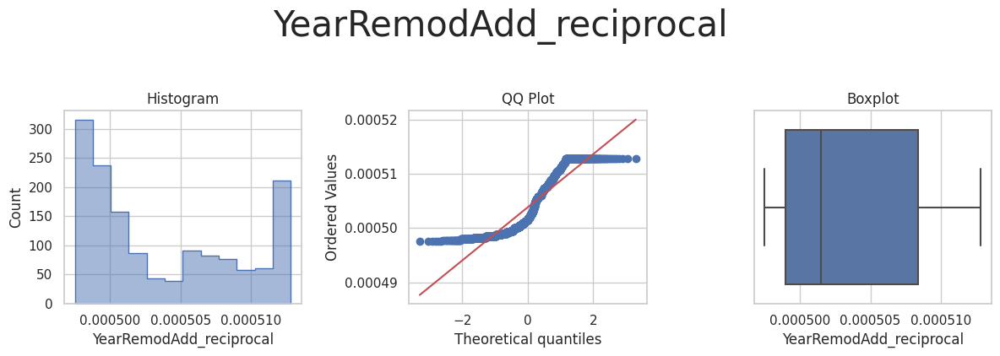

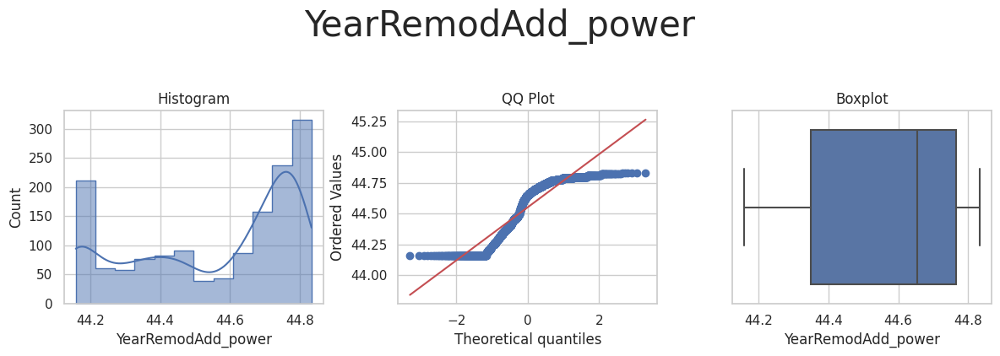

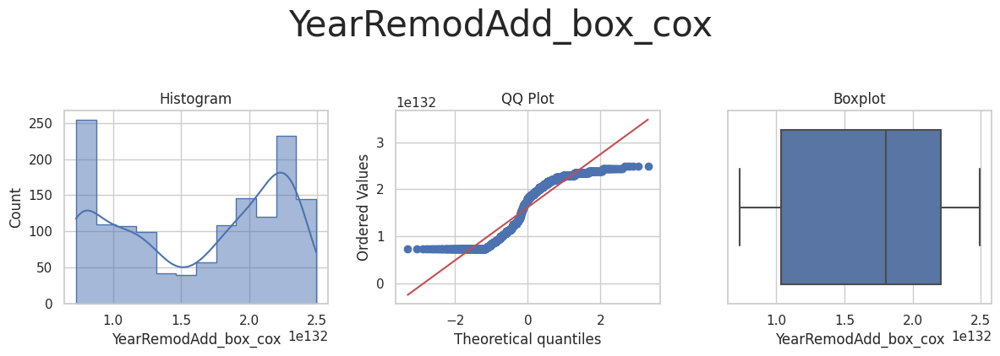

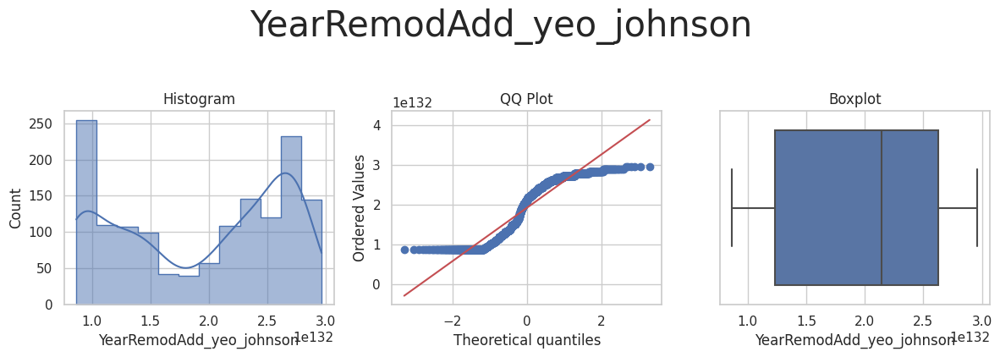

In [9]:
numerical_variables_engineering = FeatureEngineeringAnalysis(df=numerical_variables_engineering, analysis_type='numerical')

## Observations

Remembering our objective is here is to use transformers to make the distribution closer to normal distribution. Specifically we look at the skewness and kurtosis of the original and transformed data. After a manual review of the visualisations we will apply the PowerTranformer to all numerical variables. This transformer works on all variables and reduces skewness. Additionally, assigning a single transformer is a straightforward approach.

## Outliers

We have already seen in the DataInspection notebook that based on an IQR analysis of all variables there are a number of outliers in the data set. This is confirmed in the box plots in the above visualisations. These can affect the accuracy of the model, so we need an approach to deal with this. In the first instance we will apply a Windsorizer to cap the minimum and maximum values and see it's affect on the data.

Note that before we apply the Windsorizer we should apply the Ordinal Encoder and Power Transformer to a copy of the data as we are interested here in it's effect on the transformed, rather than the raw data. We can construct a pipeline to apply the changes. 

In [10]:
from sklearn.pipeline import Pipeline

house_prices_clean_df_copy = house_prices_clean_df.copy()

pipeline = Pipeline([
     ("OrdinalCategoricalEncoder",OrdinalEncoder(encoding_method='arbitrary', 
                                                  variables = ['BsmtExposure',
                                                               'BsmtFinType1',
                                                               'GarageFinish',
                                                               'KitchenQual'] ) ),

      ('pt', vt.PowerTransformer(variables = ['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr', 'BsmtFinSF1', 'BsmtUnfSF', 'GarageArea',
'GarageYrBlt', 'GrLivArea', 'LotArea', 'LotFrontage', 'MasVnrArea', 'OpenPorchSF', 'OverallCond', 
'OverallQual', 'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd']) ),
  ])

df_transformed = pipeline.fit_transform(house_prices_clean_df_copy)
df_transformed.head()

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
0,29.257478,29.223278,1.732051,0,26.570661,0,12.247449,23.409400,0,44.754888,...,91.923882,8.062258,14.000000,7.810250,2.236068,2.645751,29.257478,44.754888,44.754888,208500
1,35.524639,0.000000,1.732051,1,31.272992,1,16.852300,21.447611,0,44.452222,...,97.979590,8.944272,0.000000,0.000000,2.828427,2.449490,35.524639,44.452222,44.452222,181500
2,30.331502,29.427878,1.732051,2,22.045408,0,20.832667,24.657656,0,44.732538,...,106.066017,8.246211,12.727922,6.480741,2.236068,2.645751,30.331502,44.732538,44.743715,223500
3,31.000000,0.000000,1.732051,0,14.696938,1,23.237900,25.337719,1,44.698993,...,97.724101,7.745967,0.000000,5.916080,2.236068,2.645751,27.495454,43.760713,44.384682,140000
4,33.837849,0.000000,2.000000,3,25.592968,0,22.135944,28.913665,0,44.721360,...,119.415242,9.165151,18.708287,9.165151,2.236068,2.828427,33.837849,44.721360,44.721360,250000


We can then examine the effect of the Windsoriser using visualisations from the FeatureEngineeringAnalysis function.

* Variable Analyzed: 1stFlrSF
* Applied transformation: ['1stFlrSF_iqr'] 



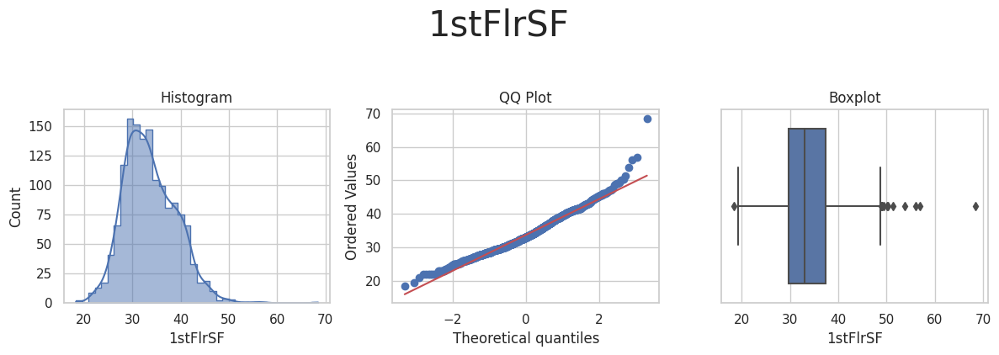

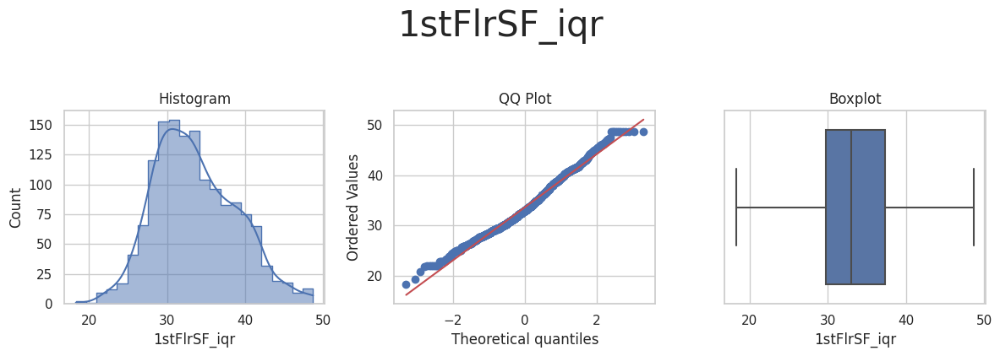



* Variable Analyzed: 2ndFlrSF
* Applied transformation: ['2ndFlrSF_iqr'] 



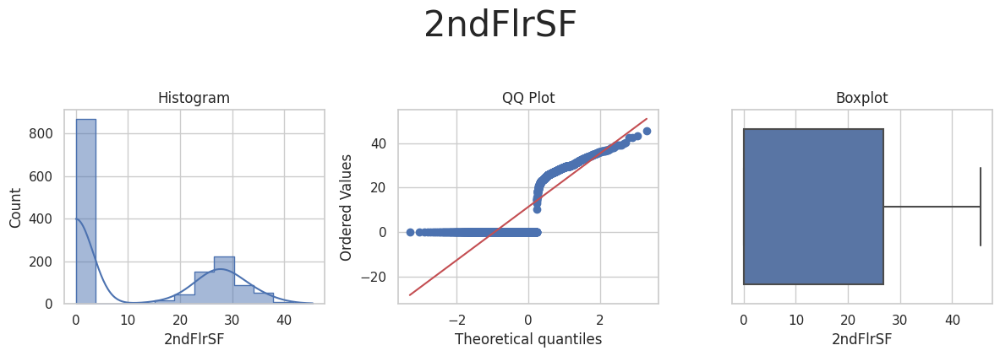

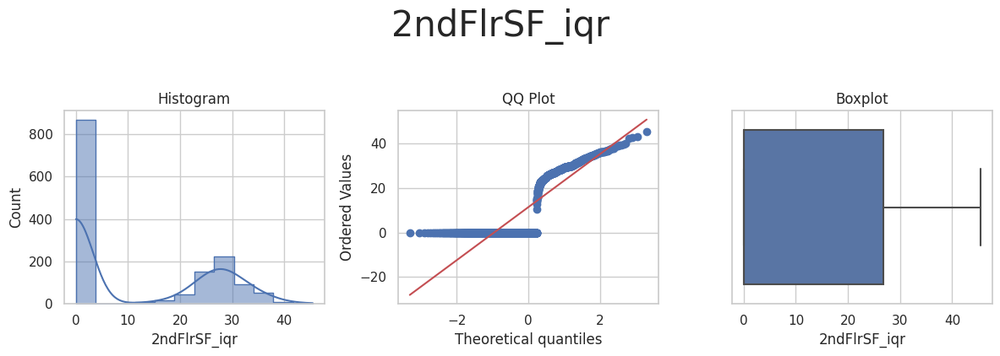



* Variable Analyzed: BedroomAbvGr
* Applied transformation: ['BedroomAbvGr_iqr'] 



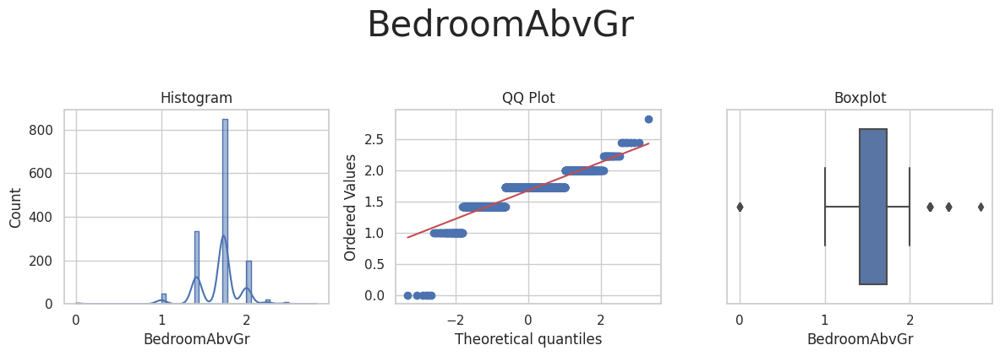

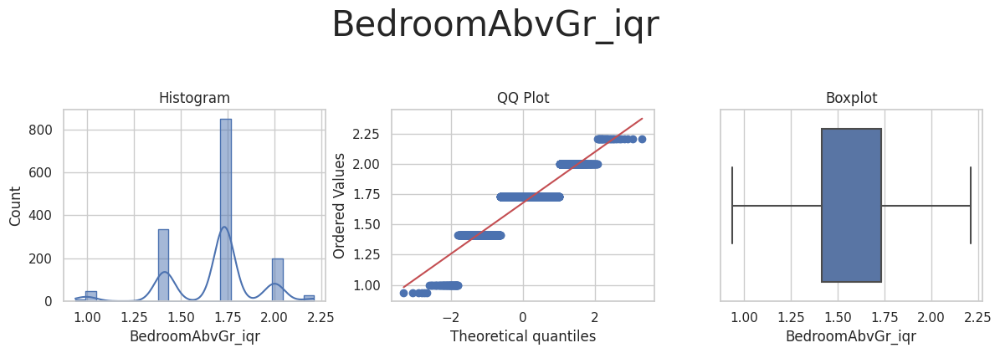



* Variable Analyzed: BsmtExposure
* Applied transformation: ['BsmtExposure_iqr'] 



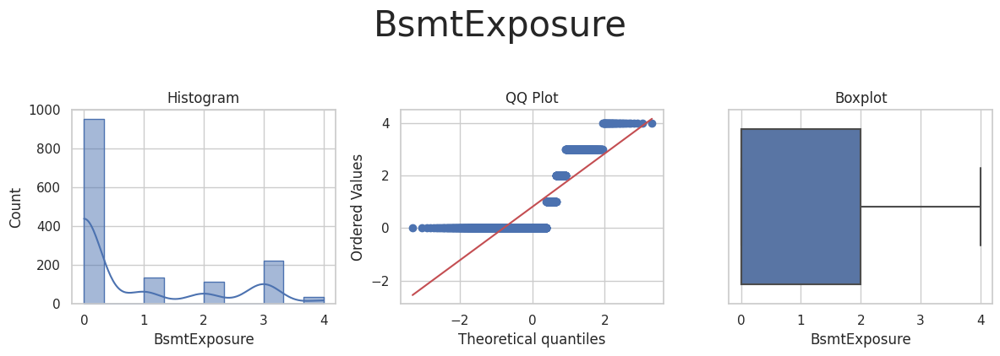

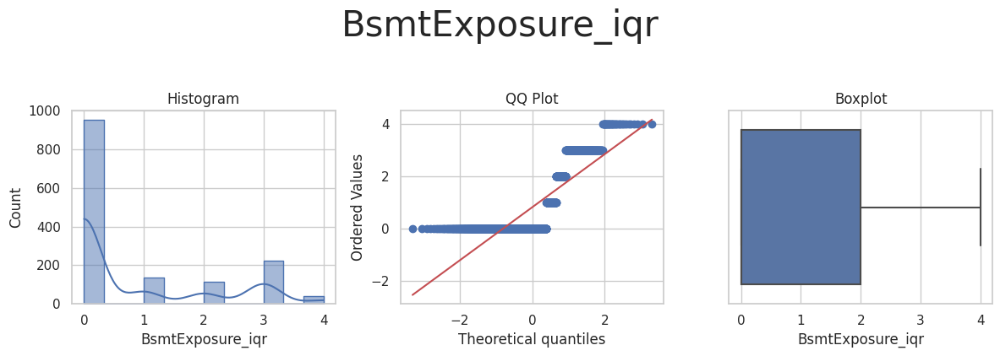



* Variable Analyzed: BsmtFinSF1
* Applied transformation: ['BsmtFinSF1_iqr'] 



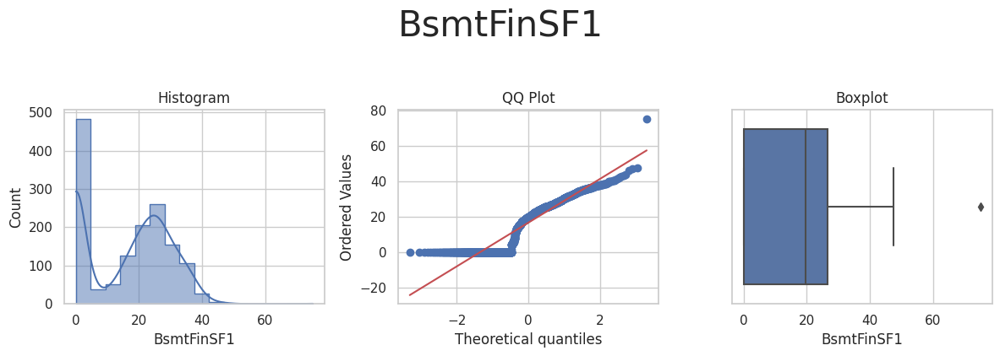

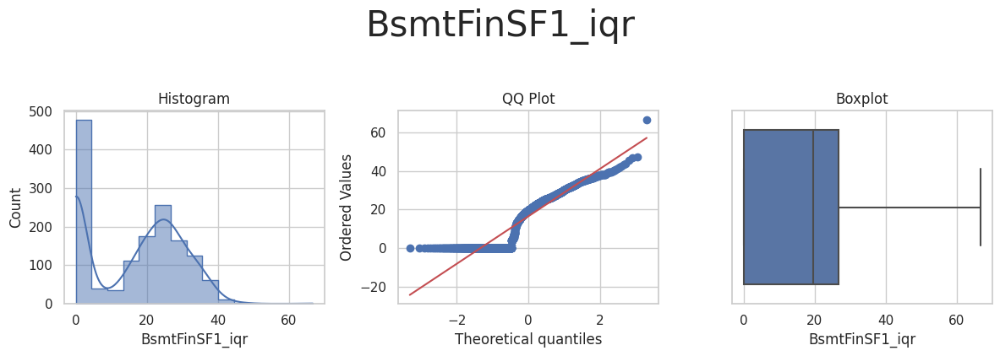



* Variable Analyzed: BsmtFinType1
* Applied transformation: ['BsmtFinType1_iqr'] 



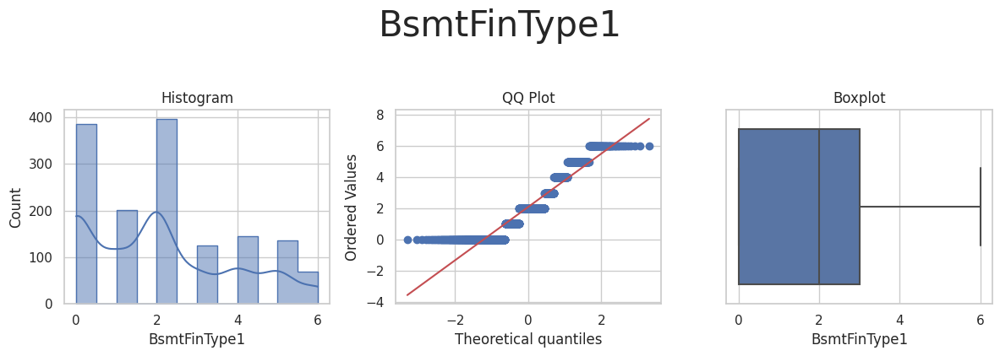

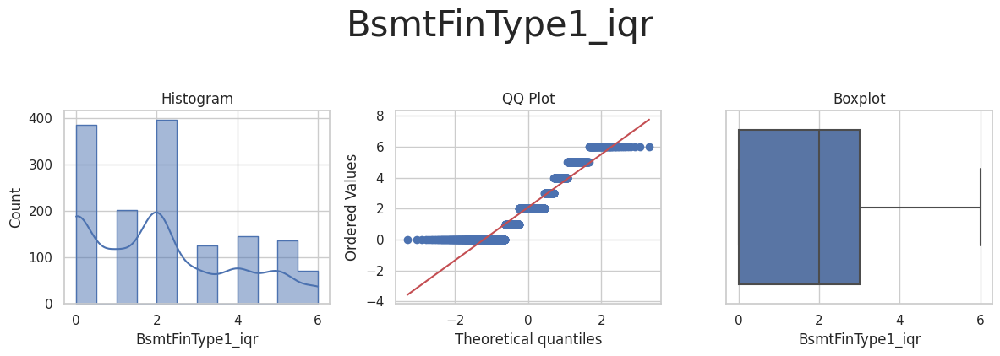



* Variable Analyzed: BsmtUnfSF
* Applied transformation: ['BsmtUnfSF_iqr'] 



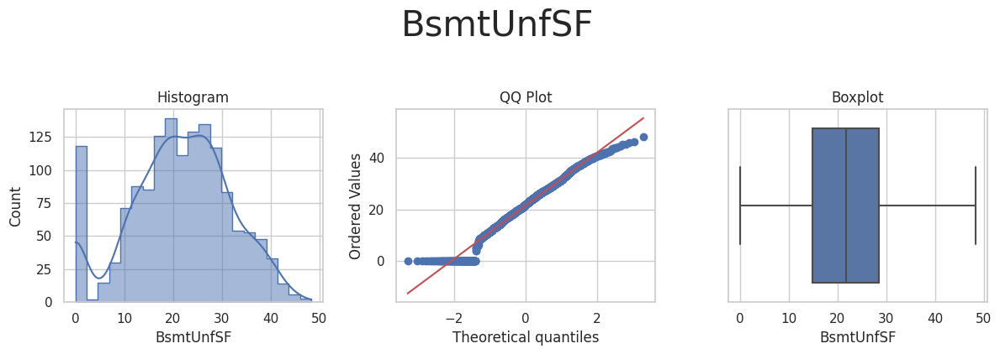

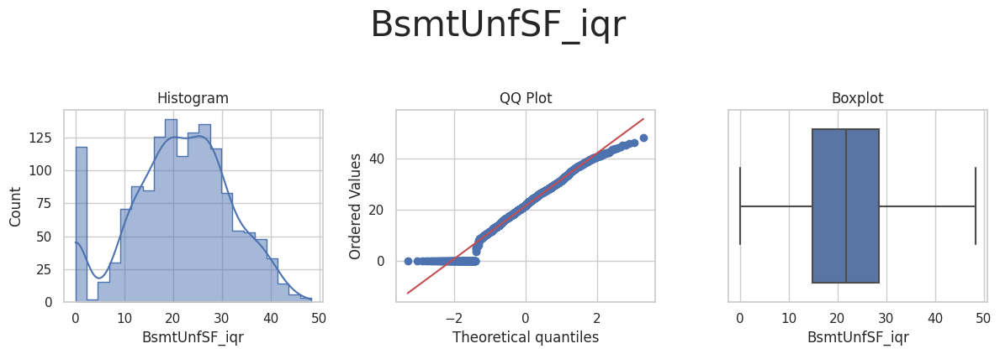



* Variable Analyzed: GarageArea
* Applied transformation: ['GarageArea_iqr'] 



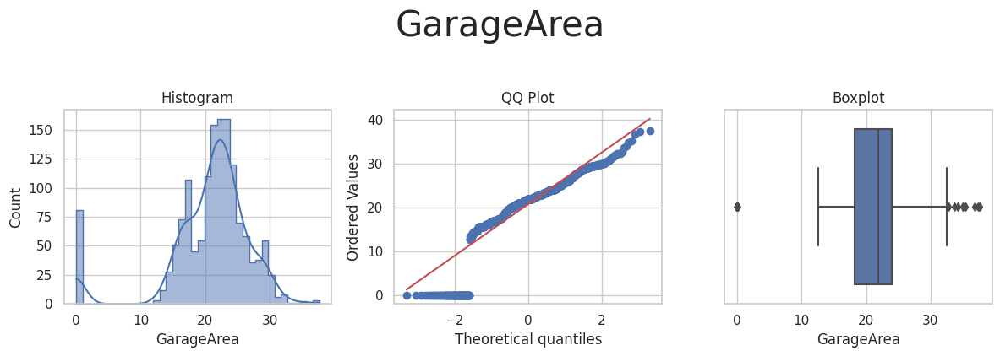

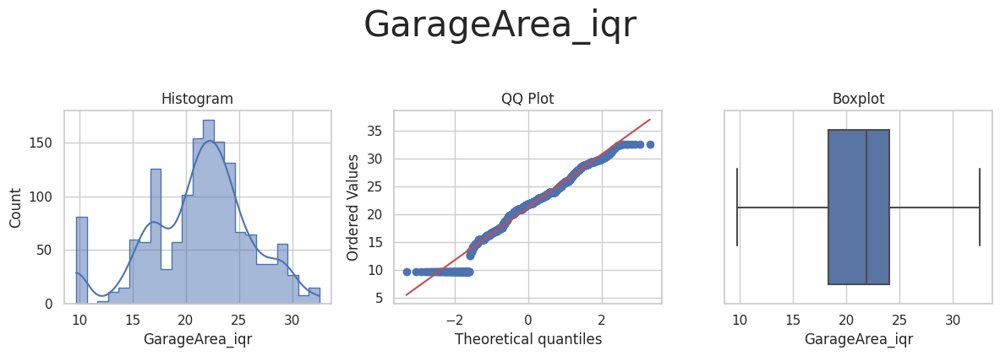



* Variable Analyzed: GarageFinish
* Applied transformation: ['GarageFinish_iqr'] 



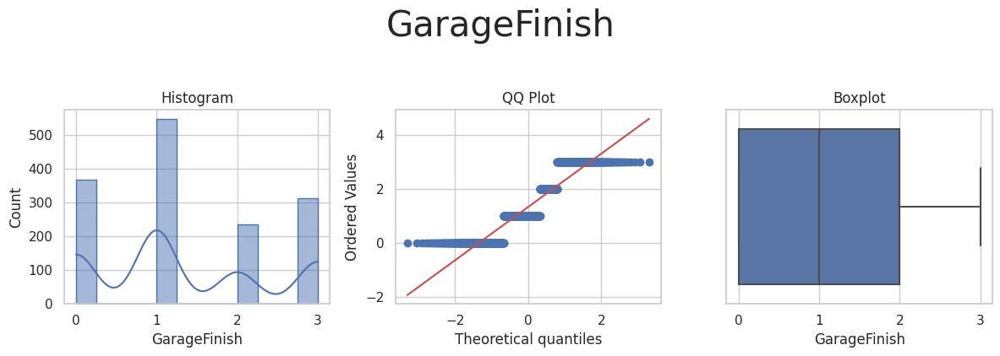

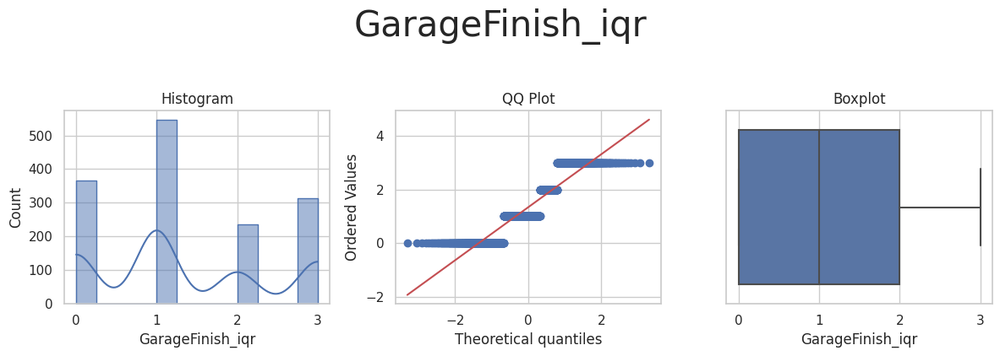



* Variable Analyzed: GarageYrBlt
* Applied transformation: ['GarageYrBlt_iqr'] 



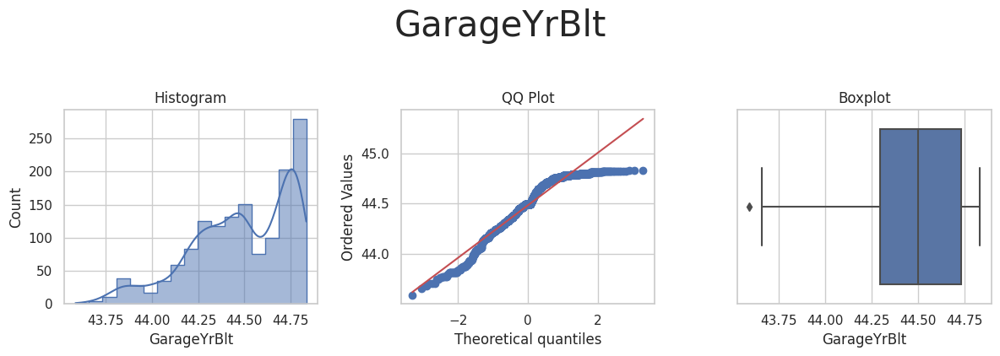

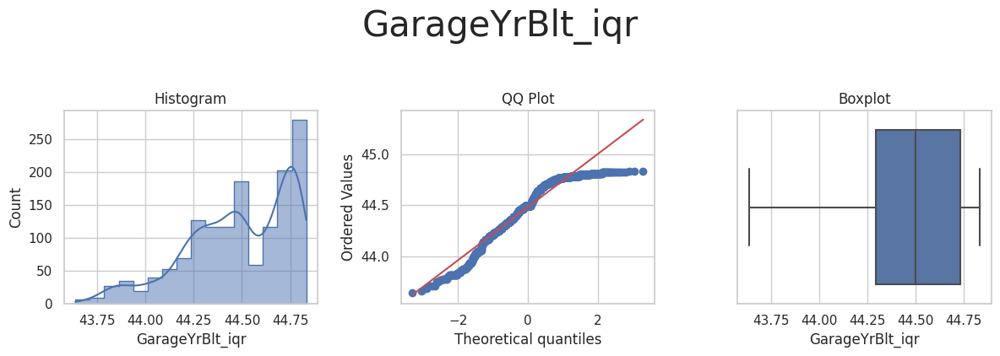



* Variable Analyzed: GrLivArea
* Applied transformation: ['GrLivArea_iqr'] 



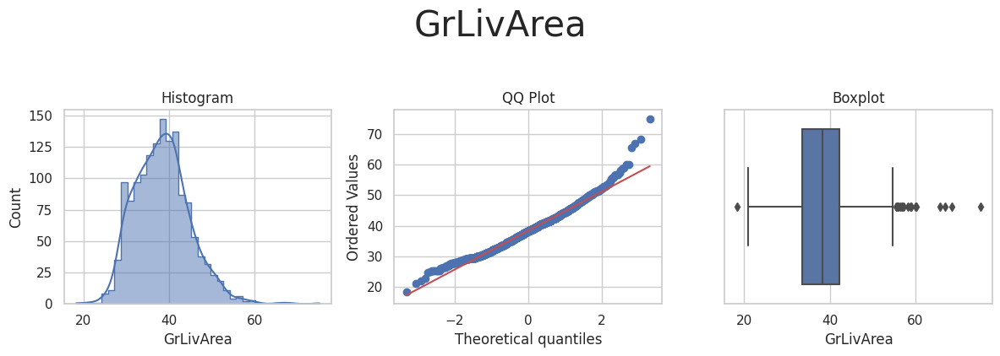

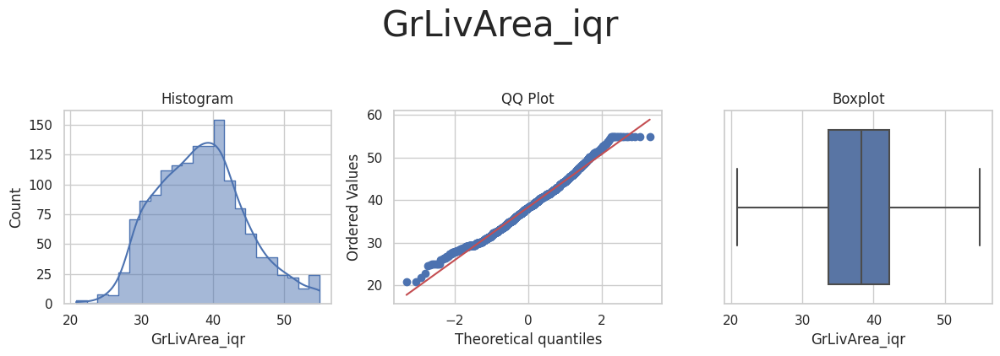



* Variable Analyzed: KitchenQual
* Applied transformation: ['KitchenQual_iqr'] 



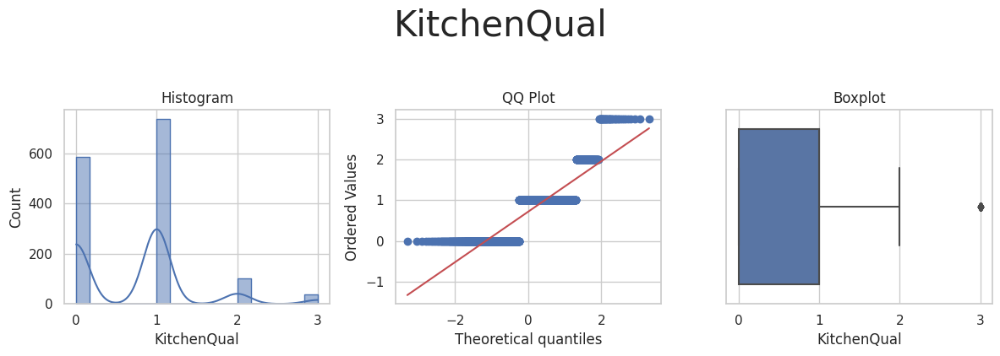

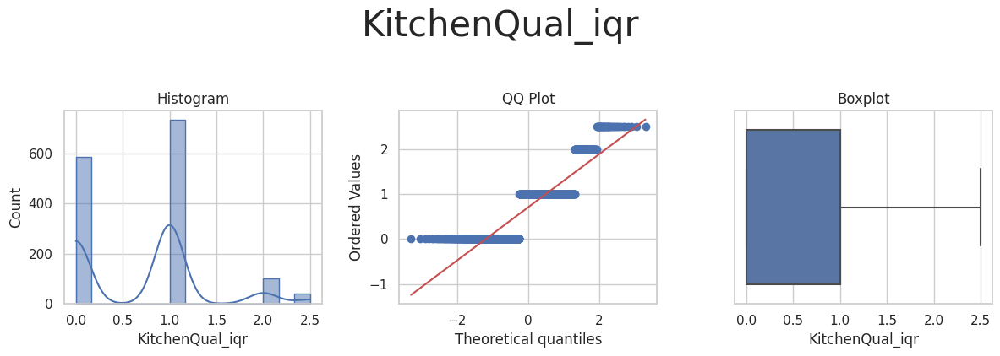



* Variable Analyzed: LotArea
* Applied transformation: ['LotArea_iqr'] 



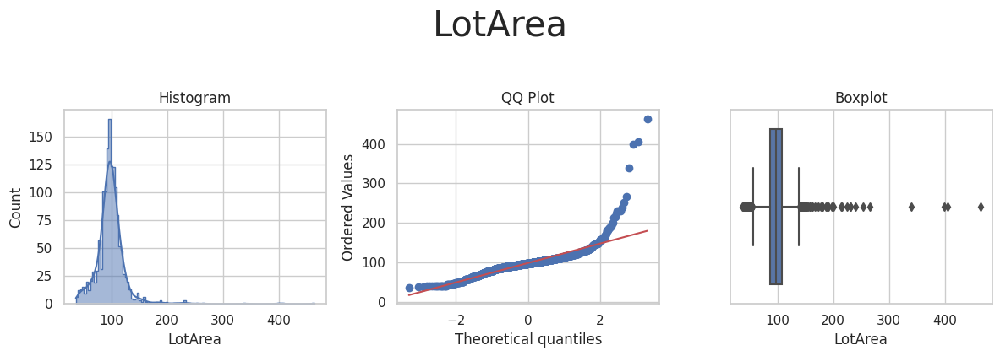

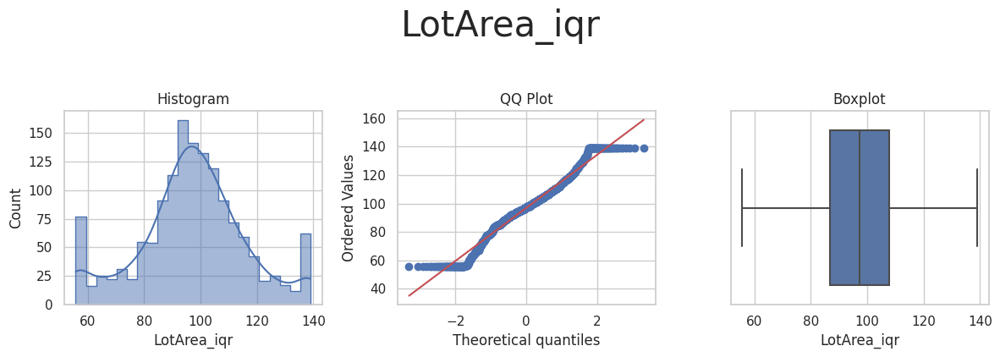



* Variable Analyzed: LotFrontage
* Applied transformation: ['LotFrontage_iqr'] 



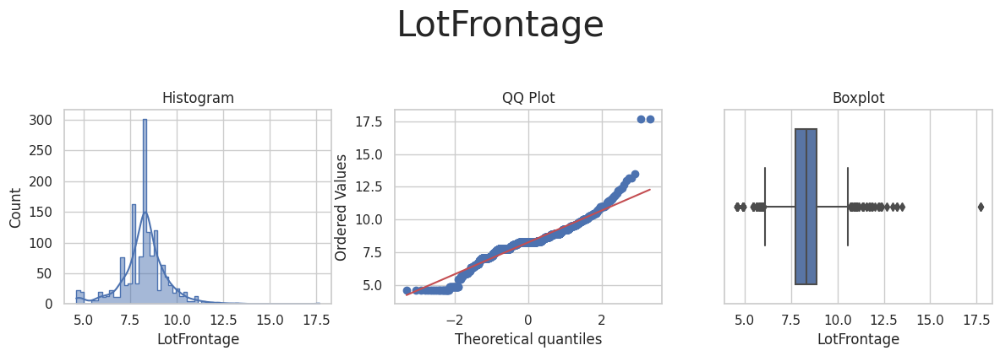

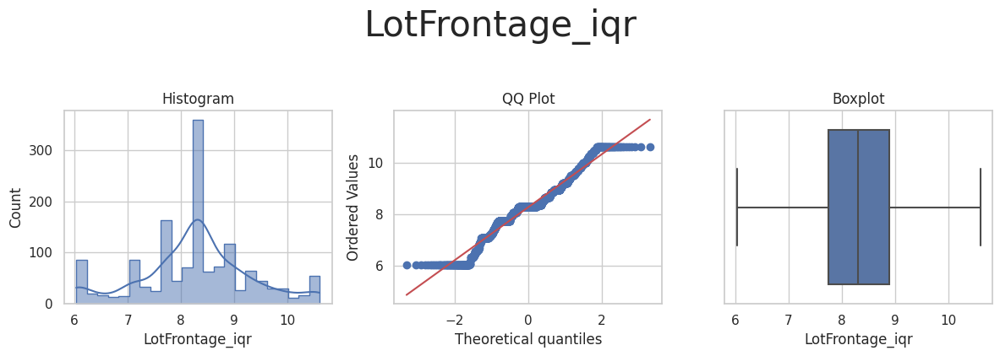



* Variable Analyzed: MasVnrArea
* Applied transformation: ['MasVnrArea_iqr'] 



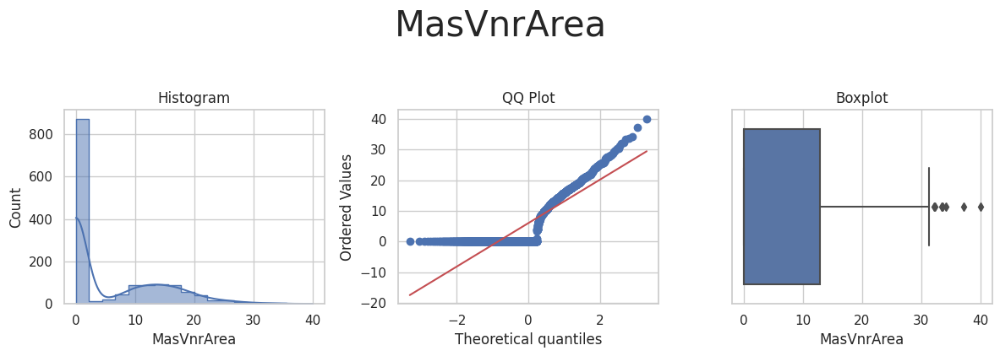

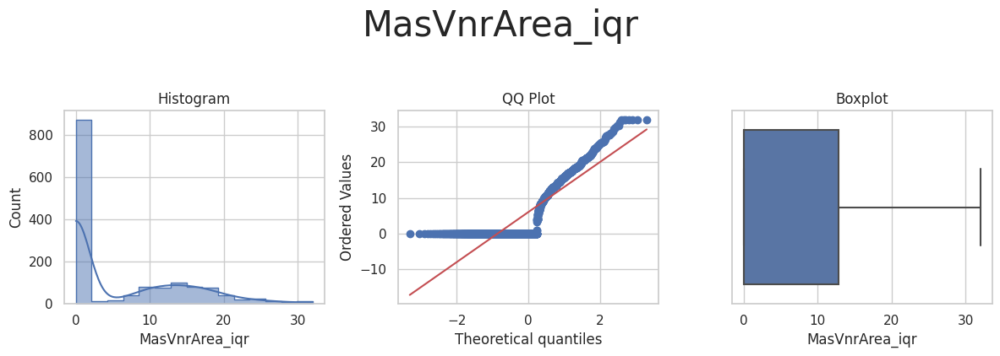



* Variable Analyzed: OpenPorchSF
* Applied transformation: ['OpenPorchSF_iqr'] 



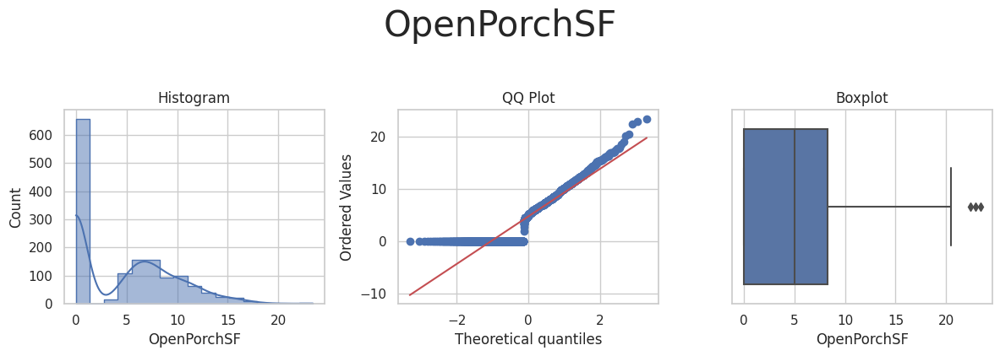

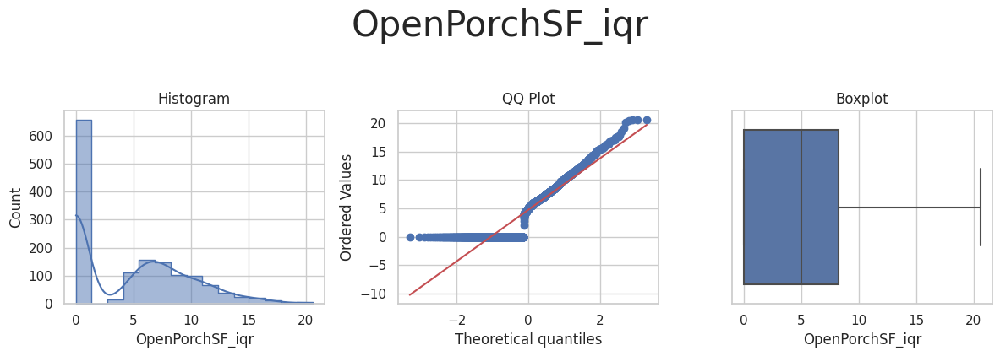



* Variable Analyzed: OverallCond
* Applied transformation: ['OverallCond_iqr'] 



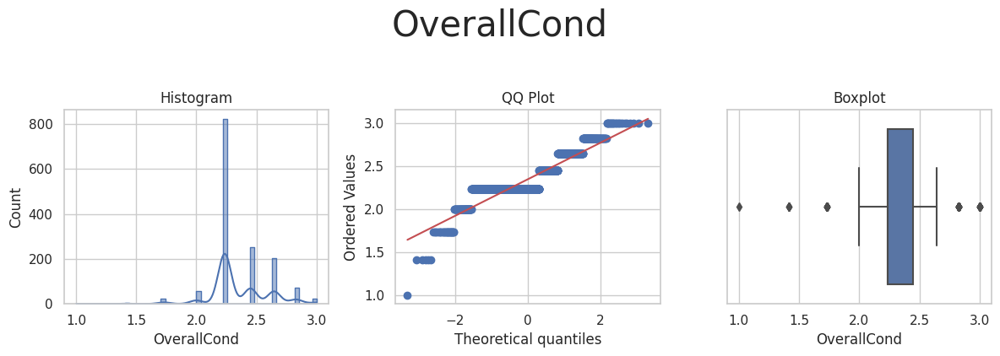

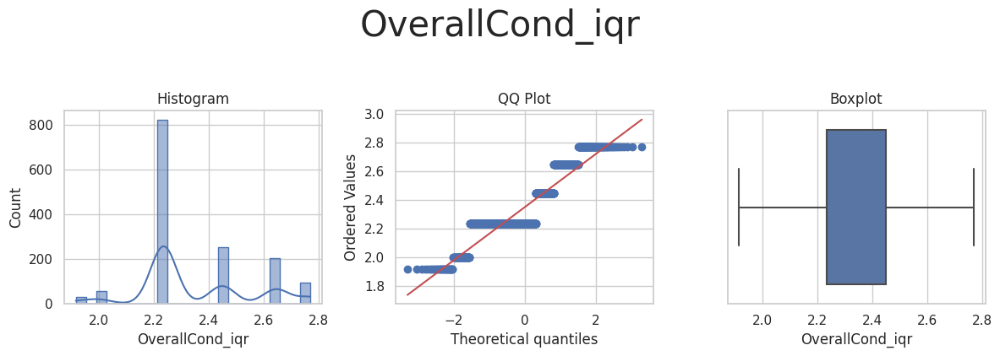



* Variable Analyzed: OverallQual
* Applied transformation: ['OverallQual_iqr'] 



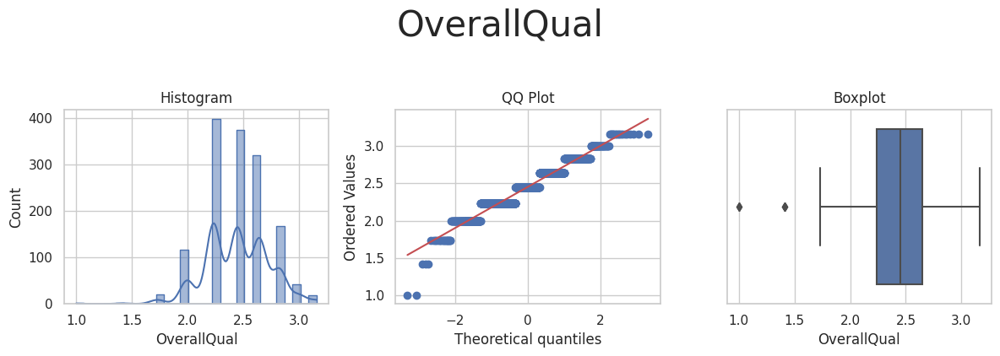

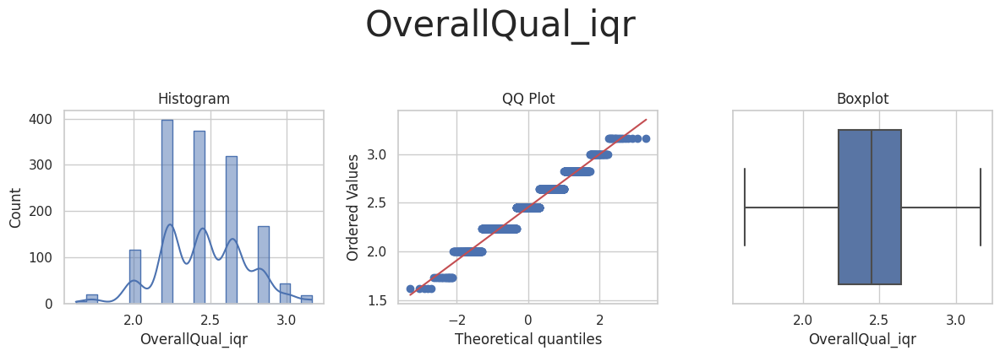



* Variable Analyzed: TotalBsmtSF
* Applied transformation: ['TotalBsmtSF_iqr'] 



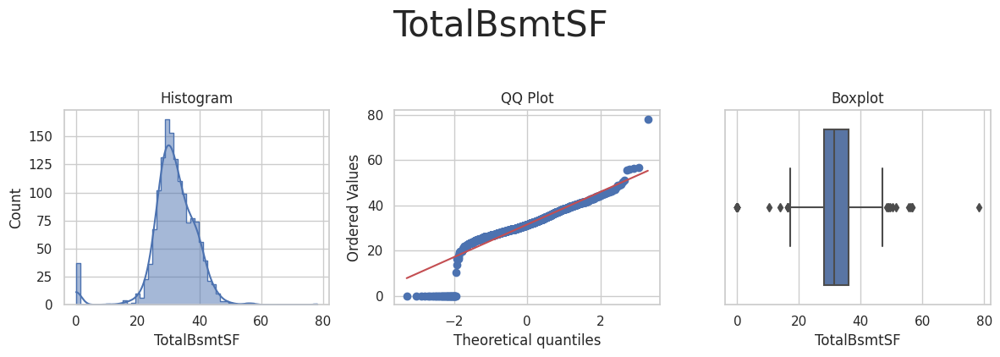

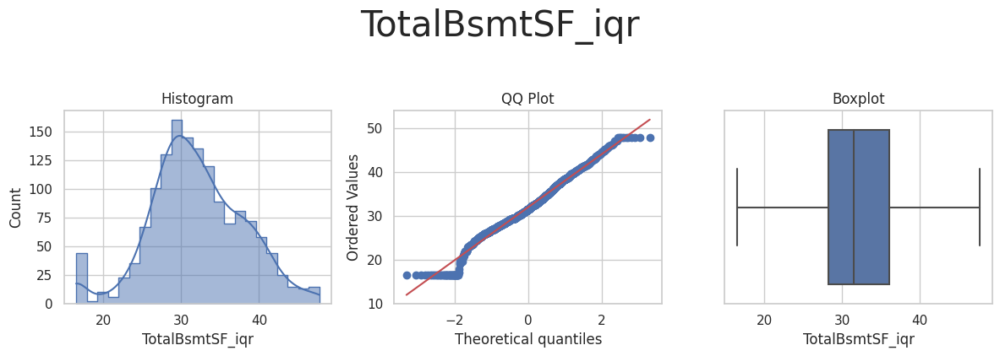



* Variable Analyzed: YearBuilt
* Applied transformation: ['YearBuilt_iqr'] 



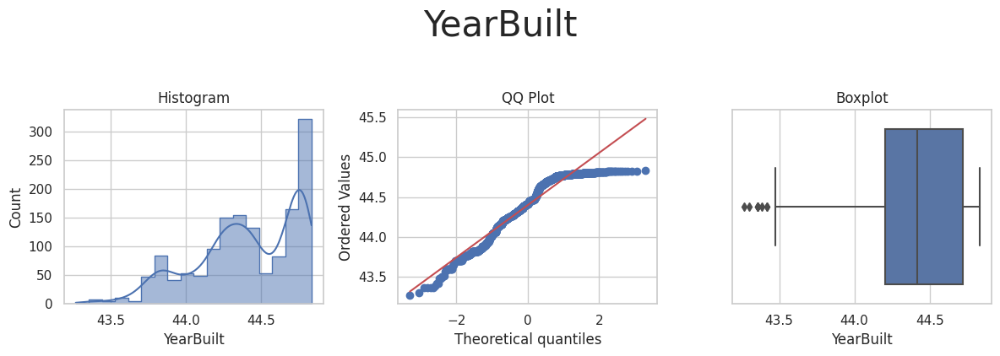

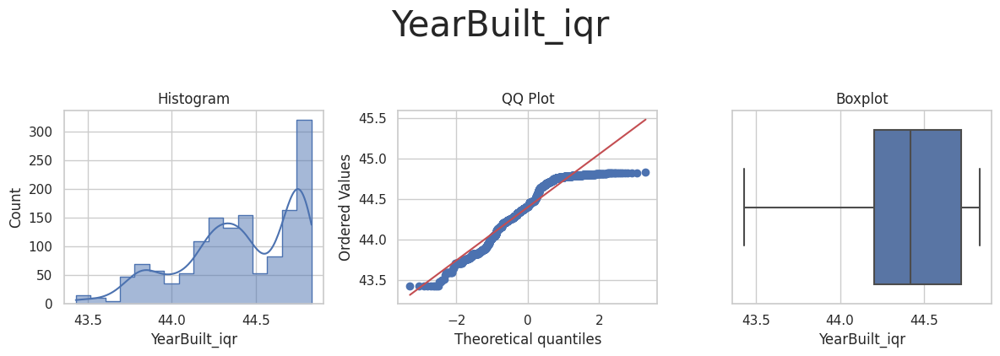



* Variable Analyzed: YearRemodAdd
* Applied transformation: ['YearRemodAdd_iqr'] 



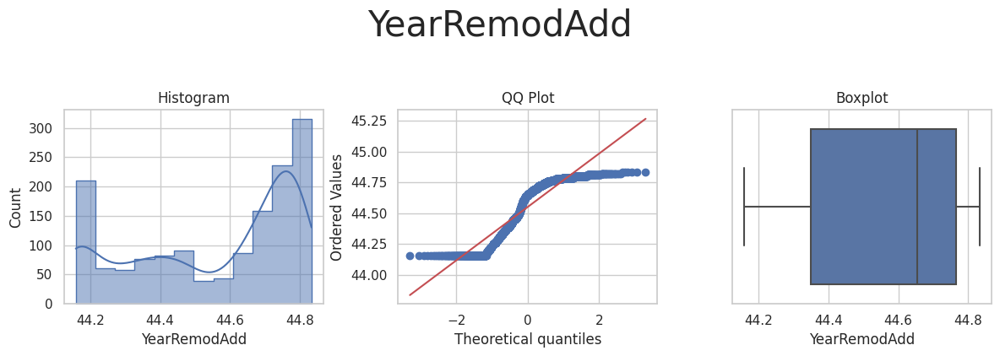

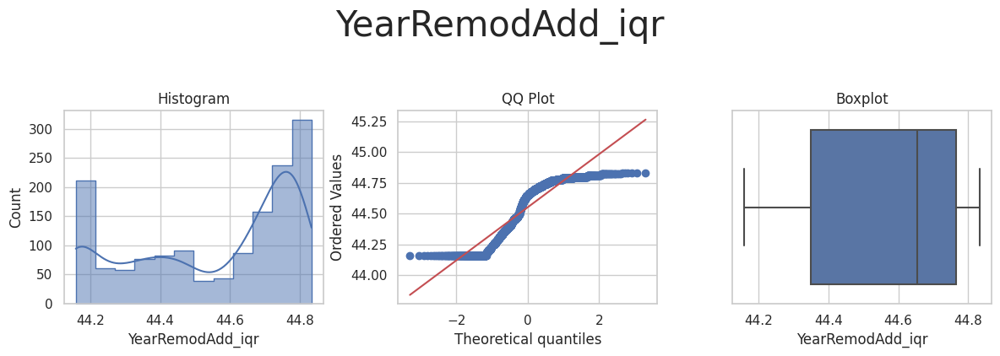



* Variable Analyzed: SalePrice
* Applied transformation: ['SalePrice_iqr'] 



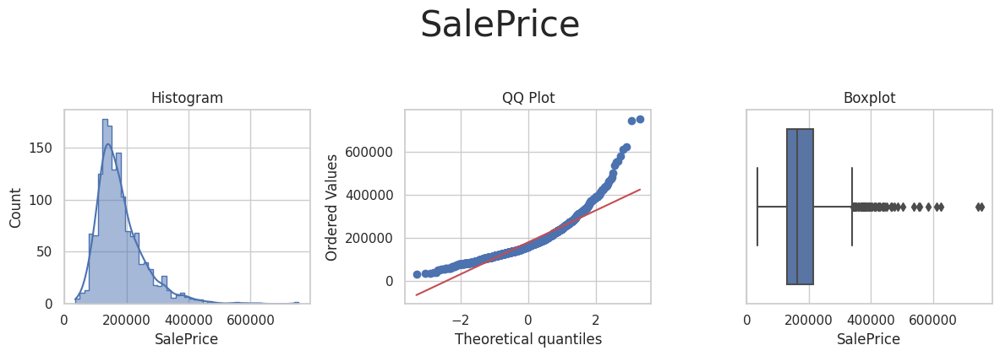

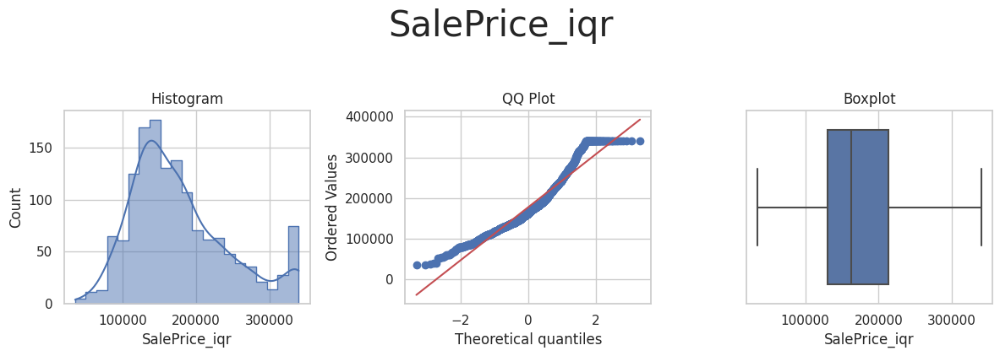

In [11]:
df_engineering = FeatureEngineeringAnalysis(df=df_transformed, analysis_type='outlier_winsorizer')

We can see from the above visualisations (And the box-plots in particular) that the outliers have been removed without having a significantly adverse effect on distribution. We will therefore use a Windzorizer on our data. This is prefferable to using trimming methods as it allows us to retain a larger proportion of the data.

Finally, we will apply the Windsorizer to the dataset in preparation for the next steps.

In [12]:
df_transformed_copy = df_transformed.copy()

pipeline = Pipeline([
      ( 'winsorizer_iqr', Winsorizer(capping_method='iqr', fold=1.5, tail='both') )
  ])

house_prices_transformed_and_windsorized = pipeline.fit_transform(df_transformed_copy)
house_prices_transformed_and_windsorized.head()

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
0,29.257478,29.223278,1.732051,0.0,26.570661,0.0,12.247449,23.409400,0.0,44.754888,...,91.923882,8.062258,14.000000,7.810250,2.236068,2.645751,29.257478,44.754888,44.754888,208500.0
1,35.524639,0.000000,1.732051,1.0,31.272992,1.0,16.852300,21.447611,0.0,44.452222,...,97.979590,8.944272,0.000000,0.000000,2.769622,2.449490,35.524639,44.452222,44.452222,181500.0
2,30.331502,29.427878,1.732051,2.0,22.045408,0.0,20.832667,24.657656,0.0,44.732538,...,106.066017,8.246211,12.727922,6.480741,2.236068,2.645751,30.331502,44.732538,44.743715,223500.0
3,31.000000,0.000000,1.732051,0.0,14.696938,1.0,23.237900,25.337719,1.0,44.698993,...,97.724101,7.745967,0.000000,5.916080,2.236068,2.645751,27.495454,43.760713,44.384682,140000.0
4,33.837849,0.000000,2.000000,3.0,25.592968,0.0,22.135944,28.913665,0.0,44.721360,...,119.415242,9.165151,18.708287,9.165151,2.236068,2.828427,33.837849,44.721360,44.721360,250000.0


## Feature Scaling

Scaling our data is an important step in preparing our data for our model. It makes all the features have a common scale and will reduce the chances of one feature disproportionately affecting the result. We want to visualise the impact on the variables to make sure distribution isn't affected.

In [19]:
from sklearn.preprocessing import StandardScaler

scaled_data = house_prices_transformed_and_windsorized.copy()

pipeline = Pipeline([
      ("feature_scaling", StandardScaler()) 
  ])

scaled_data = pipeline.fit_transform(scaled_data)

scaled_data = pd.DataFrame(data= scaled_data, columns = house_prices_transformed_and_windsorized.columns)
scaled_data.head()

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
0,-0.826112,1.266489,0.229096,-0.651112,0.771201,-1.155290,-0.882194,0.436078,-1.246373,1.015656,...,-0.264017,-0.199040,0.982925,0.627075,-0.553837,0.684814,-0.446126,1.050838,0.878106,0.463935
1,0.357680,-0.806931,0.229096,0.156555,1.129492,-0.602629,-0.439541,0.029595,-1.246373,-0.104861,...,0.055614,0.648656,-0.737444,-0.966670,2.068195,-0.018188,0.585831,0.159433,-0.426882,0.062047
2,-0.623242,1.281006,0.229096,0.964222,0.426403,-1.155290,-0.056918,0.694717,-1.246373,0.932915,...,0.482430,-0.022244,0.826607,0.355778,-0.553837,0.684814,-0.269276,0.985015,0.829931,0.687207
3,-0.496971,-0.806931,0.229096,-0.651112,-0.133509,-0.602629,0.174291,0.835626,-0.315578,0.808725,...,0.042129,-0.503025,-0.737444,0.240555,-0.553837,0.684814,-0.736263,-1.877181,-0.718088,-0.555671
4,0.039065,-0.806931,1.383884,1.771889,0.696707,-1.155290,0.068363,1.576562,-1.246373,0.891529,...,1.187026,0.860942,1.561495,0.903554,-0.553837,1.339151,0.308082,0.952091,0.733544,1.081653


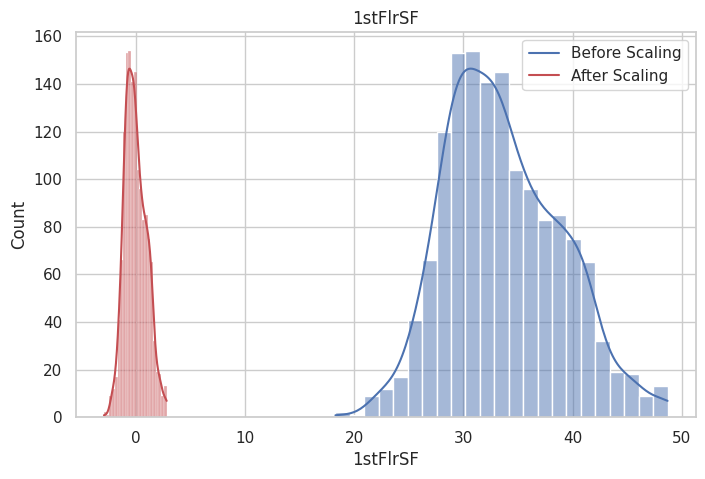

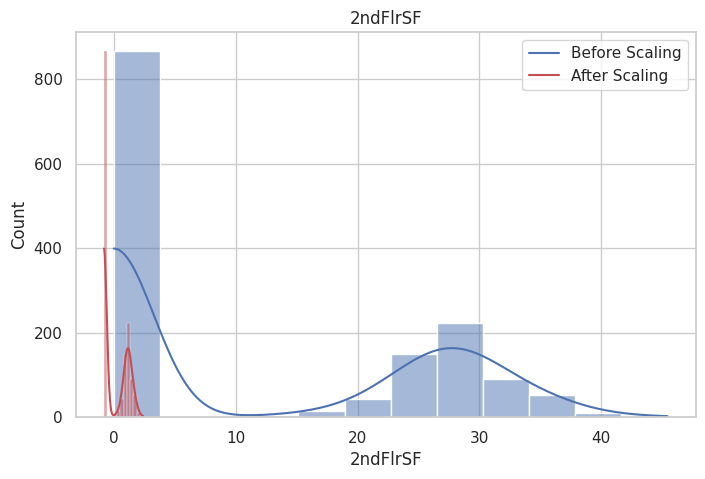

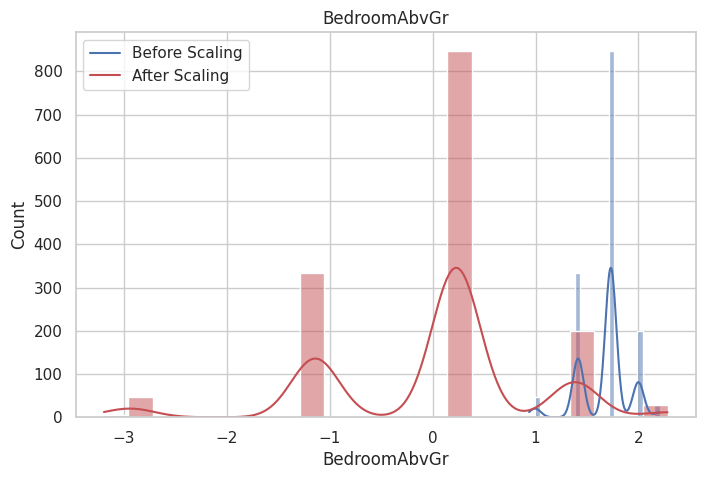

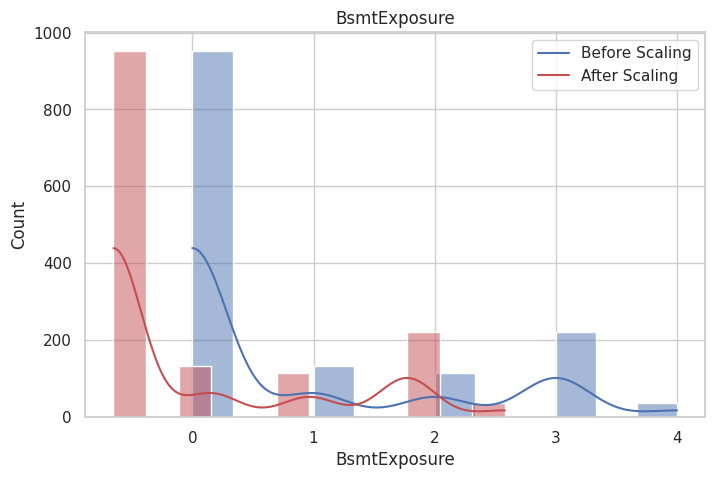

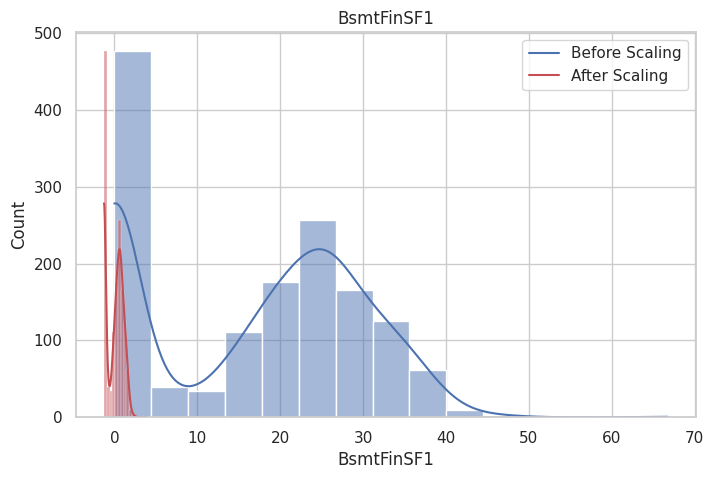

...

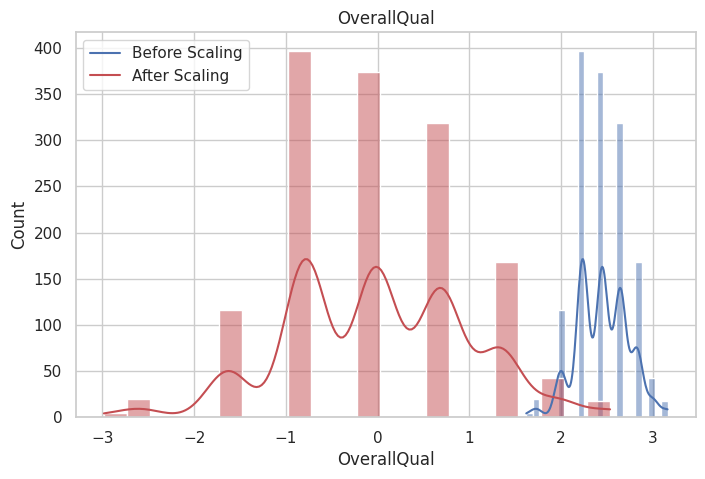

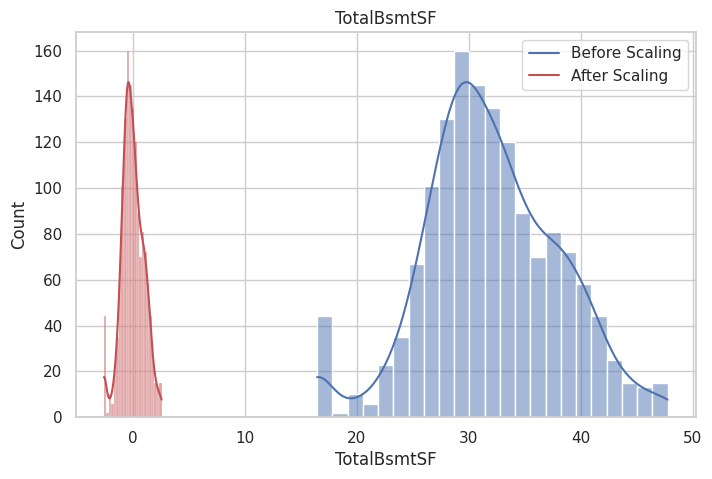

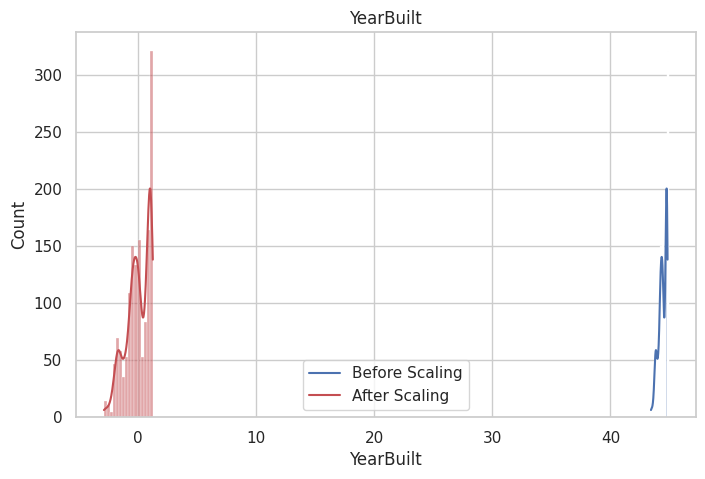

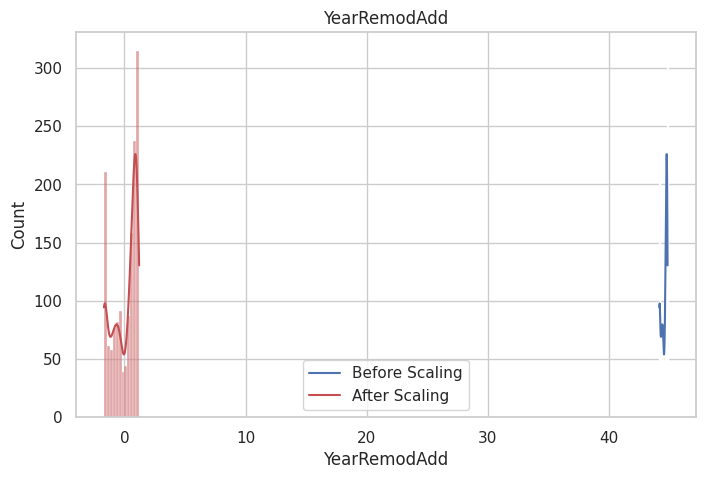

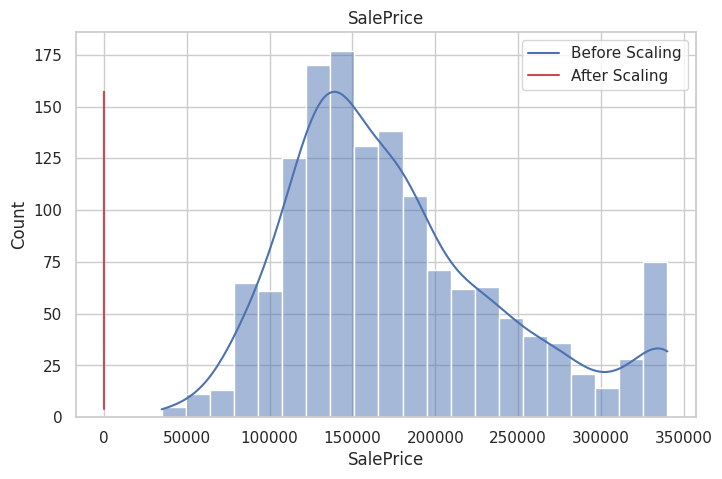

In [20]:
# This code is derived from The Code Institute Data Analysis & Machine Learning Toolkit Scikit-Learn Unit 1: ML Pipeline and ML tasks
# https://learn.codeinstitute.net/courses/course-v1:code_institute+CI_DA_ML+2021_Q4/courseware/1f851533cd6a4dcd8a280fd9f37ef4e2/f3d518ff775b4545adac7642fa290993/

for col in house_prices_transformed_and_windsorized.columns:
  fig, axes = plt.subplots(figsize=(8,5))
  sns.histplot(data=house_prices_transformed_and_windsorized, x=col, kde=True, color='b',  ax=axes)
  sns.histplot(data=scaled_data, x=col, kde=True,color='r', ax=axes)
  axes.set_title(f"{col}")
  axes.legend(labels=['Before Scaling', 'After Scaling'])
  plt.show()
  print("\n\n")

Although the differences may look acute, if we examine them carefully, we can see that whilst the ranges of some of the features have changed substantially, the overall patterns of distribution have not. We will apply Standard Scalar to our pipleline.

## Smart correlation

As a final step we can run the data through the SmartCorrelationSelection transformer. This is an efficient way of seeing if we have any correlated features. As our plan involves creating a nueral network we anticipate having to run a training set through the model many times in order to optimise it. Correlated features will add to the training time without improving the accuracy of the network, so it is a good idea to drop them ahead of time.

We run Pearson and Spearman correlations and compare the results. We set the threshold at 0.6 indicating a high level of correlation.

In [21]:

from feature_engine.selection import SmartCorrelatedSelection

pearson_correlation = scaled_data.copy()

pearson_corr_sel = SmartCorrelatedSelection(variables=None, method="pearson", threshold=0.6, selection_method="variance")

pearson_corr_sel.fit_transform(pearson_correlation)
pearson_corr_sel.correlated_feature_sets_

[{'1stFlrSF', 'SalePrice', 'TotalBsmtSF'},
 {'2ndFlrSF', 'GrLivArea'},
 {'GarageYrBlt', 'YearBuilt', 'YearRemodAdd'}]

In [22]:
pearson_corr_sel.features_to_drop_


['1stFlrSF', '2ndFlrSF', 'GarageYrBlt', 'YearBuilt', 'SalePrice']

In [23]:
spearman_corr_sel = SmartCorrelatedSelection(variables=None, method="spearman", threshold=0.6, selection_method="variance")

spearman_correlation = scaled_data.copy()

spearman_corr_sel.fit_transform(spearman_correlation)
spearman_corr_sel.correlated_feature_sets_

[{'1stFlrSF', 'TotalBsmtSF'},
 {'2ndFlrSF', 'GrLivArea'},
 {'GarageArea', 'SalePrice'},
 {'GarageYrBlt', 'YearBuilt', 'YearRemodAdd'}]

In [24]:
spearman_corr_sel.features_to_drop_


['1stFlrSF', '2ndFlrSF', 'GarageArea', 'GarageYrBlt', 'YearBuilt']

Both Spearman and Pearson correlations agree. We will drop '1stFlrSF', '2ndFlrSF', 'GarageArea', 'GarageYrBlt', 'YearBuilt' from the data set. We will obviously not drop SalesPrice as it is our target!

## Conclusions.

We will apply the below encoders to our variables.

Ordinal Encoder: 'BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual'

Power Transformer: 'BedroomAbvGr', 'BsmtFinSF1', 'BsmtUnfSF', 'GrLivArea', 'LotArea', 'LotFrontage', 'MasVnrArea', 'OpenPorchSF', 'OverallCond', 
'OverallQual', 'TotalBsmtSF', 'YearRemodAdd'

Windsorizer: All Variables.

Standard Scalar: All variables.

Drop:  '1stFlrSF', '2ndFlrSF', 'GarageArea', 'GarageYrBlt', 'YearBuilt'

---